## Preproccessing and Setup

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
sns.set(style="white")

plt.style.use("bmh")
plt.rcParams.update({"figure.figsize" : (12, 8),
                     "axes.facecolor" : "white",
                     "axes.edgecolor":  "black",
                    "axes.titlesize": "x-large",
                    "axes.labelsize": "x-large",
                    'xtick.labelsize':"x-large",
                     'ytick.labelsize':"x-large",
                    'legend.fontsize':"x-large"})

import warnings
warnings.filterwarnings('ignore')
import pickle
# import dcor 
# from statsmodels.tsa.seasonal import seasonal_decompose

import tensorflow as tf
from tensorflow.keras.layers import Dense, LSTM, Dropout, BatchNormalization

# from sklearn.preprocessing import MinMaxScaler, StandardScaler
# from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [2]:
tf.random.set_seed(13)
np.random.seed(13)
# random.seed(13)
def mean_absolute_percentage_error(y_true, y_pred):
  for i in range(len(y_true)):
    if y_true[i] == 0:
      print('MAPE * Founded')
      y_true[i] = np.mean(y_true)
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [3]:
data = pd.read_csv('DowDataset.csv', sep=',', date_parser=True)
dataset1 = data.iloc[:343].copy()
dataset2 = data.iloc[396:754].copy()
dataset_test = data.iloc[761:].copy()
full_dataset = pd.concat([dataset1, dataset2, dataset_test], axis=0 , ignore_index=True)
full_dataset = full_dataset.drop(['DATE', 'Flow_to_EQ'], axis=1)

In [4]:
cor_data = dataset1.copy()

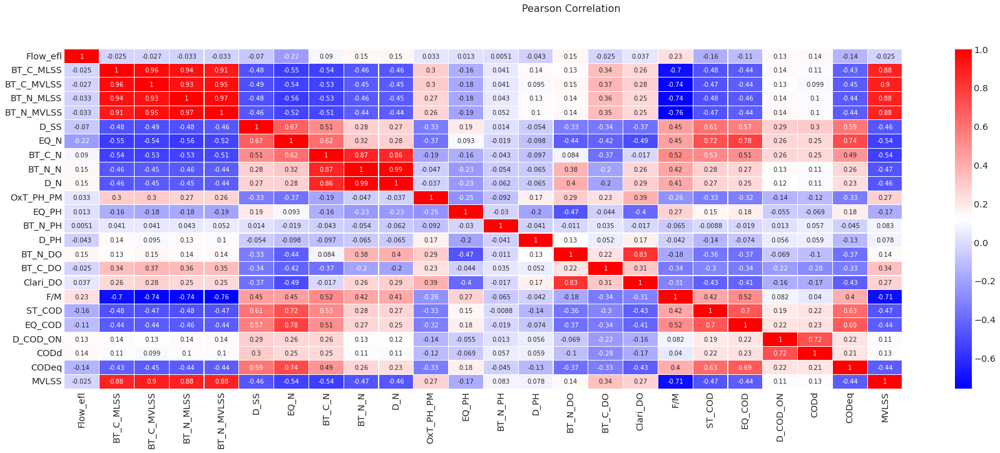

In [5]:
cor_data['CODd'] = cor_data['D_COD_ON'].shift(-1).fillna(method='ffill')
cor_data['CODeq'] = cor_data['EQ_COD'].shift(-1).fillna(method='ffill')
cor_data['MVLSS'] = cor_data['BT_C_MVLSS'].shift(-1).fillna(method='ffill')

pearson = cor_data.corr(method='pearson')
fig = plt.figure(figsize=(30,10))
fig.suptitle('Pearson Correlation', fontsize=16)
sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
plt.show()

In [6]:
mean_absolute_percentage_error(dataset1['D_COD_ON'], dataset1['D_COD_ON'])

0.0

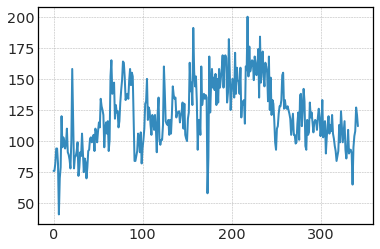

In [7]:
dataset1['D_COD_ON'].plot()

In [8]:
class approach1:
  def __init__(self, df, goal, window_size = 5):
    self.df = df.copy()
    self.goal = goal
    self.window_size = window_size

    self.df['trend'] = self.df[self.goal].rolling(self.window_size).mean().fillna(method='bfill')
    self.df['residual'] = self.df[self.goal] - self.df['trend']
    self.df['target'] = self.df['residual'].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.X = self.df[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON', 'residual']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_activation = 'tanh'
      self.model_layers = 2
      self.model_neurons = [6, 24]
    elif self.goal == 'EQ_COD':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_activation = 'linear'
      self.model_layers = 2
      self.model_neurons = [10, 18]
    elif self.goal == 'BT_C_MVLSS':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_activation = 'relu'
      self.model_layers = 2
      self.model_neurons = [14, 22]

    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std

    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(self.model_neurons[0], activation = self.model_activation, input_dim= self.X_train.shape[1]))
    self.model.add(BatchNormalization())
    if self.model_layers == 2:
      self.model.add(Dense(self.model_neurons[1], activation = self.model_activation))
    self.model.add(Dense(1))

    self.model.compile(optimizer= self.model_optimizer, loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1, shuffle = False)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('approach1.h5')

  def tune(self, max_epochs = 50):
    self.tune_results = {}
    OPTIMIZER = ['SGD', 'adam']
    ACTIVATION = ['relu', 'tanh']
    NUM_UNITS = [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32]
    NUM_LAYER = [1, 2]
    n = 1
    min_score = 100
    for activation in ACTIVATION: 
      for optimizer in OPTIMIZER:
        for num_layer in NUM_LAYER:
          if num_layer == 1:
            for neurons in NUM_UNITS:
              self.model = tf.keras.Sequential()
              self.model.add(Dense(neurons, activation=activation, input_dim= self.X_train.shape[1]))
              self.model.add(Dense(1))
              self.model.compile(optimizer= optimizer, loss='mse', metrics=['MAPE'])    
              history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)
              # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - Score: ', min(history_Ann.history['val_loss']))
              self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Activation': activation, 'Layers':num_layer , 'Neurons': {neurons}, 'Score' : min(history_Ann.history['val_loss']), 'Epoch':history_Ann.history['val_loss'].index(min(history_Ann.history['val_loss']))}
              print(self.tune_results[f'{n}'])
              if min(history_Ann.history['val_loss']) < min_score:
                min_score = min(history_Ann.history['val_loss'])
                min_score_pos = n
              n+=1
          if num_layer == 2:
            for neurons in NUM_UNITS:
              for neurons2 in NUM_UNITS:
                self.model = tf.keras.Sequential()
                self.model.add(Dense(neurons, activation=activation, input_dim= self.X_train.shape[1]))
                self.model.add(Dense(neurons2, activation=activation))
                self.model.add(Dense(1))
                self.model.compile(optimizer= optimizer, loss='mse', metrics=['MAPE'])    
                history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)   
                # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - ', neurons2, ' - Score: ', min(history_Ann.history['val_loss'])) 
                self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Activation': activation, 'Layers':num_layer , 'Neurons': {neurons, neurons2}, 'Score' : min(history_Ann.history['val_loss']), 'Epoch':history_Ann.history['val_loss'].index(min(history_Ann.history['val_loss']))}
                print(self.tune_results[f'{n}'])
                if min(history_Ann.history['val_loss']) < min_score:
                  min_score = min(history_Ann.history['val_loss'])
                  min_score_pos = n
                n+=1  
    self.best_tuned = self.tune_results[f'{min_score_pos}']
  
  def testing(self, df_test):
    self.df_test = df_test.copy()
    self.df_test['trend'] = self.df_test[self.goal].rolling(self.window_size).mean().fillna(method='ffill')
    self.df_test = self.df_test.iloc[-self.df_test.shape[0]+self.window_size:]
    self.df_test['residual'] = self.df_test[self.goal] - self.df_test['trend']
    self.df_test['target'] = self.df_test['residual'].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.Xt = self.df_test[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON', 'residual']].fillna(method='ffill')
    elif self.goal == 'EQ_COD':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')
    elif self.goal == 'BT_C_MVLSS':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')

    self.X_test = (self.Xt - self.x_mean)/self.x_std
    self.Y_test = self.df_test[self.goal].shift(-1).fillna(method='ffill')
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.prediction = self.prediction*self.y_std + self.y_mean
    self.full_prediction = self.df_test['trend'].reset_index(drop=True) + self.prediction['Prediction']

    print('*** ANN estimation ***')
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction.values))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction.values, squared=False))
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()


In [9]:
class approach2:
  def __init__(self, df, goal):
    self.df = df.copy()
    self.goal = goal

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.X = self.df[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_activation = 'tanh'
      self.model_layers = 2
      self.model_neurons = [4, 32]
    elif self.goal == 'EQ_COD':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')
      self.model_optimizer = 'adam'
      self.model_activation = 'tanh'
      self.model_layers = 2
      self.model_neurons = [2, 18]
    elif self.goal == 'BT_C_MVLSS':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')
      self.model_optimizer = 'adam'
      self.model_activation = 'linear'
      self.model_layers = 2
      self.model_neurons = [4, 10]

    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def series_to_supervised(self, n_in=5, n_out=1, dropnan=True):
    self.n_in = n_in
    self.n_out = n_out

    n_vars = 1 if type(self.X_train) is list else self.X_train.shape[1]
    df = pd.DataFrame(self.X_train)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
      cols.append(df.shift(i))
      names += [('%s(t-%d)' % (df.columns[j],i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
      cols.append(df.shift(-i))
      if i == 0:
        names += [('%s(t)' % (df.columns[j])) for j in range(n_vars)]
      else:
        names += [('%s(t+%d)' % (df.columns[j], i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
      agg.dropna(inplace=True)
    self.supervised = agg
    self.supervised_train = self.supervised.values.reshape((self.supervised.shape[0], 1, self.supervised.shape[1]))
    self.Y_train = self.Y_train.iloc[n_in:]

  def training(self, max_epochs = 50):
    #print(neurons)
    self.model = tf.keras.Sequential()
    self.model.add(LSTM(self.model_neurons[0], activation = self.model_activation, return_sequences=True, input_shape=(self.supervised_train.shape[1:])))
    self.model.add(Dropout(0.1))
    if self.model_layers == 2:
      self.model.add(BatchNormalization())
      self.model.add(LSTM(self.model_neurons[1], activation = self.model_activation))
    self.model.add(Dense(1))
    self.model.compile(loss='mse', optimizer=self.model_optimizer, metrics=['mape'])  
    history = self.model.fit(self.supervised_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('approach2.h5')
  
  def tune(self, max_epochs = 50):
    self.tune_results = {}
    OPTIMIZER = ['SGD', 'adam']
    ACTIVATION = ['relu', 'linear', 'tanh']
    NUM_UNITS = [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32]
    NUM_LAYER = [1, 2]
    n = 1
    min_score = 100
    for activation in ACTIVATION:
      for optimizer in OPTIMIZER:
        for num_layer in NUM_LAYER:
          if num_layer == 1:
            for neurons in NUM_UNITS:
              self.models = tf.keras.Sequential()
              self.models.add(LSTM(neurons, activation = activation, return_sequences=True, input_shape=(self.supervised_train.shape[1:])))
              self.models.add(Dropout(0.1))
              self.models.add(Dense(1))
              self.models.compile(loss='mse', optimizer=optimizer, metrics=['mape'])  
              history = self.models.fit(self.supervised_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)
              # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - Score: ', min(history.history['val_loss']))
              self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Activation': activation, 'Layers':num_layer , 'Neurons': {neurons}, 'Score' : min(history.history['val_loss']), 'Epoch':history.history['val_loss'].index(min(history.history['val_loss']))}
              print(self.tune_results[f'{n}'])
              if min(history.history['val_loss']) < min_score:
                min_score = min(history.history['val_loss'])
                min_score_pos = n
              n+=1
          if num_layer == 2:
            for neurons in NUM_UNITS:
              for neurons2 in NUM_UNITS:
                self.models = tf.keras.Sequential()
                self.models.add(LSTM(neurons, activation = activation, return_sequences=True, input_shape=(self.supervised_train.shape[1:])))
                self.models.add(Dropout(0.1))
                self.models.add(BatchNormalization())
                self.models.add(LSTM(neurons2, activation = activation, return_sequences=True))
                self.models.add(Dense(1))
                self.models.compile(loss='mse', optimizer=optimizer, metrics=['mape'])  
                history = self.models.fit(self.supervised_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1) 
                # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - ', neurons2, ' - Score: ', min(history.history['val_loss'])) 
                self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Activation': activation, 'Layers':num_layer , 'Neurons': {neurons, neurons2}, 'Score' : min(history.history['val_loss']), 'Epoch':history.history['val_loss'].index(min(history.history['val_loss']))}
                print(self.tune_results[f'{n}'])
                if min(history.history['val_loss']) < min_score:
                  min_score = min(history.history['val_loss'])
                  min_score_pos = n
                n+=1  
    self.best_tuned = self.tune_results[f'{min_score_pos}'] 

  def testing(self, df_test):
    self.df_test = df_test.copy()
    
    def series_to_supervised_test(X_test, n_in=self.n_in, n_out=self.n_out, dropnan=True):
      n_vars = 1 if type(X_test) is list else X_test.shape[1]
      df = pd.DataFrame(X_test)
      cols, names = list(), list()
      # input sequence (t-n, ... t-1)
      for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('%s(t-%d)' % (df.columns[j],i)) for j in range(n_vars)]
      # forecast sequence (t, t+1, ... t+n)
      for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
          names += [('%s(t)' % (df.columns[j])) for j in range(n_vars)]
        else:
          names += [('%s(t+%d)' % (df.columns[j], i)) for j in range(n_vars)]
      # put it all together
      agg = pd.concat(cols, axis=1)
      agg.columns = names
      # drop rows with NaN values
      if dropnan:
        agg.dropna(inplace=True)
      supervised = agg
      supervised_test = supervised.values.reshape((supervised.shape[0], 1, supervised.shape[1]))
      return supervised_test
    # self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.Xt = self.df_test[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='ffill')
    elif self.goal == 'EQ_COD':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')
    elif self.goal == 'BT_C_MVLSS':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')

    # self.Xt = self.df_test[['BT_C_MLSS','EQ_N', 'BT_C_N', 'D_COD_ON']].fillna(method='ffill')
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    self.Y_test = self.df_test[self.goal].shift(-1).fillna(method='ffill').iloc[self.n_in:]
    self.supervised_test = series_to_supervised_test(self.X_test)
    
    self.prediction = pd.DataFrame(self.model.predict(self.supervised_test).reshape(-1,1), columns=['Prediction'])
    self.full_prediction = self.prediction*self.y_std + self.y_mean
    
    print('*** LSTM estimation ***')
    # print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    # print ('R2: ',r2_score(self.Y_test.values, self.full_prediction.values))
    # print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction.values, squared=False))
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction.values))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction.values, squared=False))
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [10]:
class approach3:
  def __init__(self, df, goal):    
    self.df = df.copy()
    self.goal = goal

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.X = self.df[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='bfill')
    elif self.goal == 'EQ_COD':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill')
    elif self.goal == 'BT_C_MVLSS':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill')
    
    # self.X = self.df[['BT_C_MLSS','EQ_N', 'BT_C_N', 'D_COD_ON']].fillna(method='bfill')
    self.Y = self.df['target'].fillna(method='bfill')
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = self.X
    self.Y_train = self.Y
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self):
    from sklearn.svm import SVR
    self.model = SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.2)
    self.model = self.model.fit(self.X_train.values, self.Y_train.values)
    # self.model.save('approach3.h5')
    pickle.dump(self.model, open('approach3.sav', 'wb'))
  
  def testing(self, df_test):
    self.df_test = df_test.copy()
    
    if self.goal == 'D_COD_ON':
      self.X_test = self.df_test[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='bfill').fillna(method='ffill')
    elif self.goal == 'EQ_COD':
      self.X_test = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill').fillna(method='ffill')
    elif self.goal == 'BT_C_MVLSS':
      self.X_test = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill').fillna(method='ffill')

    # self.X_test = self.df_test[['BT_C_MLSS','EQ_N', 'BT_C_N', 'D_COD_ON']].fillna(method='ffill').fillna(method='bfill')
    self.X_test = (self.X_test - self.x_mean)/self.x_std
    self.Y_test = self.df_test[self.goal].shift(-1).fillna(method='ffill')
        
    self.prediction = self.model.predict(self.X_test)
    # self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])
    self.amplifier = 10
    full_prediction = self.prediction*self.y_std + self.y_mean

    self.full_prediction = full_prediction
    # self.full_prediction = np.zeros(len(self.prediction))
    # self.full_prediction[0] = self.df_test[self.goal].reset_index(drop=True)[0] + full_prediction[0] 
    # for i in range(1,len(self.prediction)):
    #   self.full_prediction[i] = self.full_prediction[i-1] - full_prediction[i]
    # self.full_prediction = 3*self.prediction
    
    print('*** Delta estimation ***')
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [11]:
class Ensemble:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[['model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[['model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [12]:
class Ensemble2:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[[self.goal, 'model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    # print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [13]:
class Ensemble3:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
  

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
 
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 16, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons/2, activation='relu', input_dim = self.X_train.shape[1]))
    self.model.add(Dense(neurons, activation='relu'))
    self.model.add(Dense(3, activation='softmax'))

    print(self.Y_train.shape)
    print(self.X_train.shape)

    self.model.compile(optimizer= 'adam', loss='categorical_crossentropy', metrics=['accuracy'])
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df_test['model1'] - self.df_test['target'])
    model2 = abs(self.df_test['model2'] - self.df_test['target'])
    model3 = abs(self.df_test['model3'] - self.df_test['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Yt = pd.get_dummies(temp)   

    self.Y_test = self.Yt
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    print(self.X_test, self.Y_train)

    self.score = self.model.evaluate(self.X_test, self.Y_test)
    self.prediction = self.model.predict(self.X_test)
    
    self.full_prediction = np.zeros(len(self.prediction))
    self.selection = pd.DataFrame(self.prediction).idxmax(axis=1)

    
    for i in range(len(self.prediction)):
      self.full_prediction[i] = self.df_test[f'model{int(self.selection[i])+1}'][i]
    # print(self.full_prediction)

    self.Ys_test = self.df_test['target']
    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('MAPEsci: ',mean_absolute_error(self.Ys_test, self.full_prediction)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('R2: ',r2_score(self.Ys_test, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Ys_test, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Ys_test, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

# BT_C_MVLSS

In [245]:
active_target = "BT_C_MVLSS"
dataset = dataset1.copy()
dataset.shape
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 343 entries, 0 to 342
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DATE        343 non-null    object 
 1   Flow_to_EQ  343 non-null    object 
 2   Flow_efl    343 non-null    float64
 3   BT_C_MLSS   343 non-null    float64
 4   BT_C_MVLSS  343 non-null    float64
 5   BT_N_MLSS   343 non-null    float64
 6   BT_N_MVLSS  343 non-null    float64
 7   D_SS        343 non-null    float64
 8   EQ_N        343 non-null    float64
 9   BT_C_N      343 non-null    float64
 10  BT_N_N      343 non-null    float64
 11  D_N         343 non-null    float64
 12  OxT_PH_PM   343 non-null    float64
 13  EQ_PH       343 non-null    float64
 14  BT_N_PH     343 non-null    float64
 15  D_PH        343 non-null    float64
 16  BT_N_DO     343 non-null    float64
 17  BT_C_DO     343 non-null    float64
 18  Clari_DO    343 non-null    float64
 19  F/M         343 non-null    f

In [246]:
# cut_off = 68
# active_targets = ['BT_C_MVLSS', 'EQ_COD', 'D_COD_ON']
# for j in range(0,3):
#   active_target = active_targets[j]
#   print('\n********************************************************************************************\n')
#   print(f'\n************************ {active_target} *****************************\n')
#   print('\n********************************************************************************************\n')
#   for i in range(2,8):
#     print('\n********************************************************************************************')
#     print(f'Trial with {i} day rolling windowning')
#     app1 = approach1(dataset.iloc[:-cut_off], active_target, i)
#     app1.training()
#     app1.testing(dataset.iloc[5:-cut_off])
#     app1.full_prediction.shape

## Approach 1

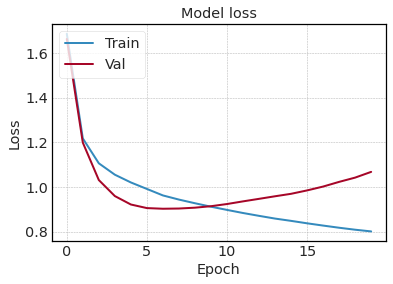

*** ANN estimation ***
MAPE:  5.36465825349122
R2:  0.5273137768947603
RMSE:  585.759758706435


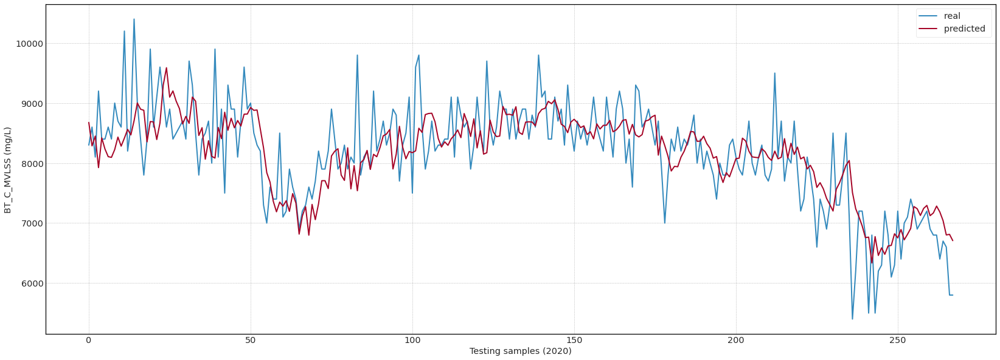

(268,)

In [247]:
cut_off = 68
app1 = approach1(dataset.iloc[:-cut_off], active_target, 5)
app1.training(max_epochs=20)
app1.testing(dataset.iloc[2:-cut_off])
# app1.testing(dataset.iloc[-142:])
app1.full_prediction.shape

## Approach 2

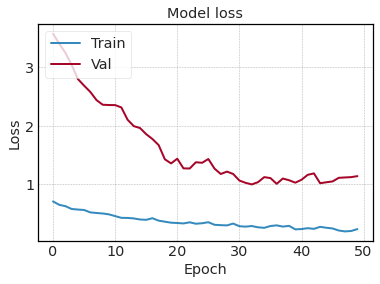

*** LSTM estimation ***
MAPE:  10.10506157828904
R2:  0.7102127871515078
RMSE:  458.6407820445874


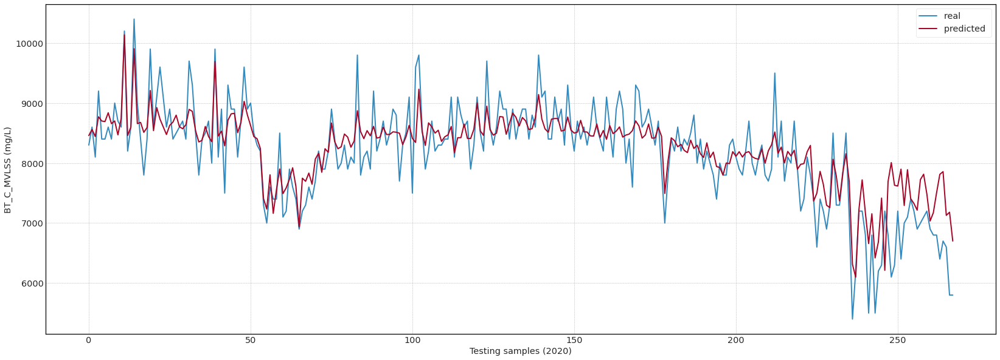

(268, 1)

In [248]:
app2 = approach2(dataset.iloc[:-cut_off], active_target)
app2.series_to_supervised(n_in=7)
app2.supervised
app2.training()
# app2.testing(dataset.iloc[-137:])
app2.testing(dataset.iloc[:-cut_off])
app2.full_prediction.shape

## Approach 3

*** Delta estimation ***
MAPE:  5.810163536553229
R2:  0.47958318486012486
RMSE:  614.6228762349515


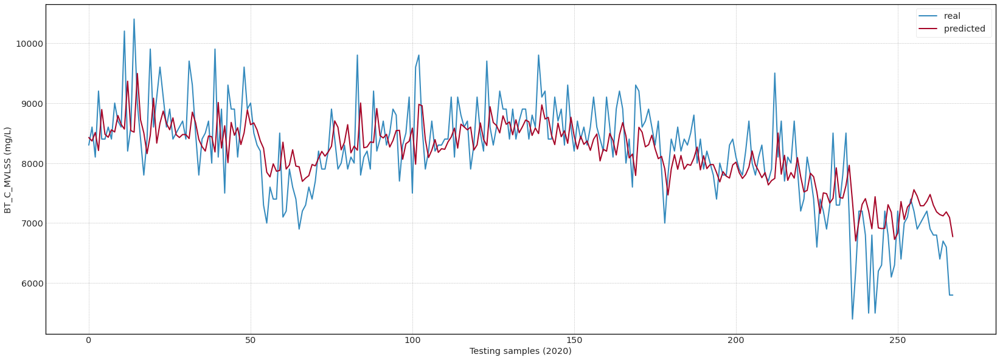

(268,)

In [249]:
app3 = approach3(dataset.iloc[:-cut_off], active_target)
app3.training()
app3.testing(dataset.iloc[7:-cut_off])
# app3.testing(dataset.iloc[-135:])
app3.full_prediction.shape

## Approaches

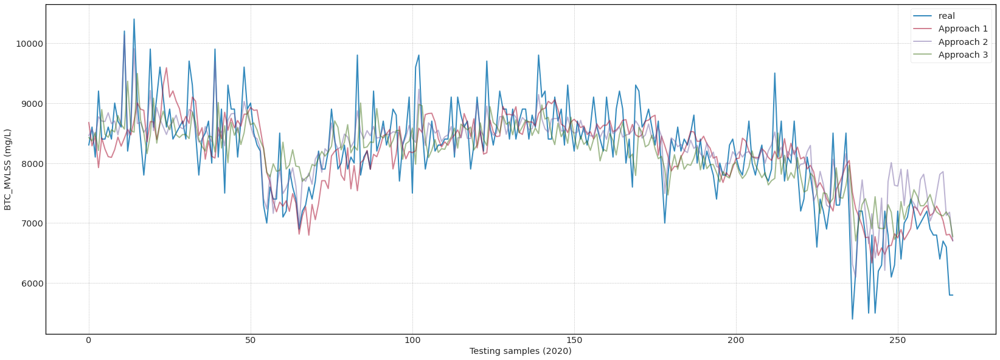

In [250]:
plt.figure(figsize=(28,10))
plt.plot(app1.Y_test.values, label = 'real ')
plt.plot(app1.full_prediction,'-', alpha= 0.5, label = 'Approach 1')
plt.plot(app2.full_prediction['Prediction'], alpha= 0.5, label = 'Approach 2')
plt.plot(app3.full_prediction, alpha= 0.5, label = 'Approach 3')
plt.ylabel('BTC_MVLSS (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

## Ensemble

In [251]:
app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction

0      25561.283825
1      25214.453849
2      25402.563548
3      24905.578832
4      26013.091887
           ...     
263    22138.643202
264    22018.492016
265    21117.276243
266    21086.263392
267    20181.382888
Length: 268, dtype: float64

### Ensemble AVG

*** Ensemble estimation ***
MAPE:  5.257777650294681
R2:  0.5525265764134624
RMSE:  569.9236559722292


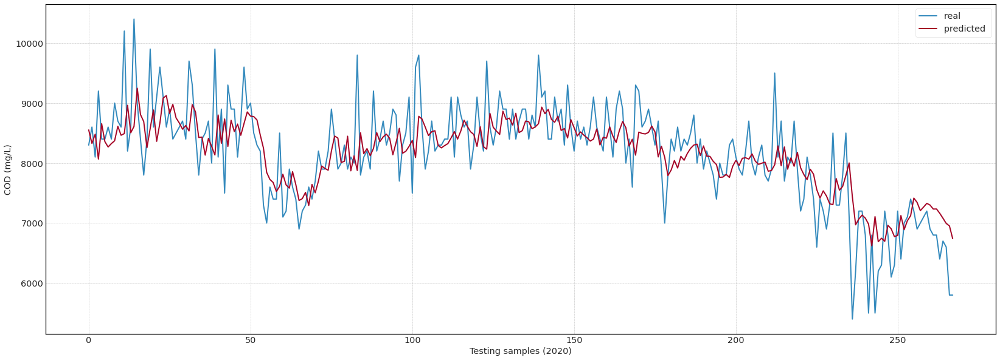

In [252]:
ensemble = (app1.full_prediction + app3.full_prediction)/2
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** Ensemble estimation ***
MAPE:  4.808793764085259
R2:  0.6465952735539924
RMSE:  506.48808960163456


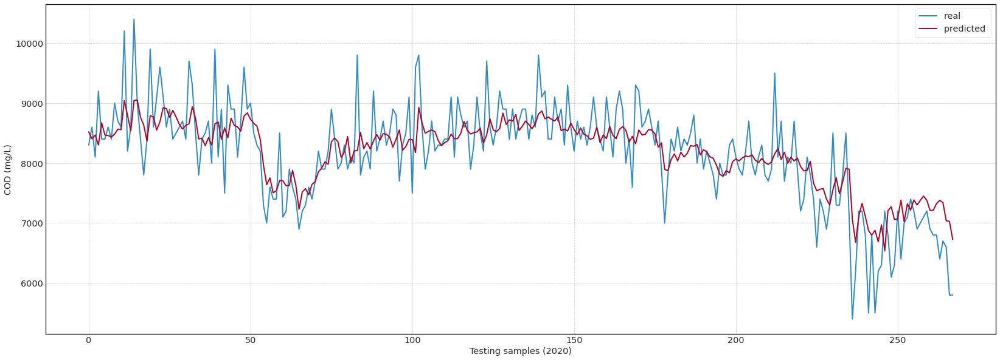

In [253]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

### Ensemble 1 - Model Fusion

Epoch 1/50
8/8 [==============================] - 0s 22ms/step - loss: 0.8789 - MAPE: 155.4671 - val_loss: 6.7098 - val_MAPE: 140.4869
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 0.8367 - MAPE: 152.8175 - val_loss: 6.3947 - val_MAPE: 136.7451
Epoch 3/50
8/8 [==============================] - 0s 3ms/step - loss: 0.7962 - MAPE: 150.8264 - val_loss: 6.1173 - val_MAPE: 133.3657
Epoch 4/50
8/8 [==============================] - 0s 4ms/step - loss: 0.7587 - MAPE: 148.6469 - val_loss: 5.8645 - val_MAPE: 130.2449
Epoch 5/50
8/8 [==============================] - 0s 4ms/step - loss: 0.7268 - MAPE: 147.9792 - val_loss: 5.6245 - val_MAPE: 127.2428
Epoch 6/50
8/8 [==============================] - 0s 4ms/step - loss: 0.6954 - MAPE: 147.4457 - val_loss: 5.4064 - val_MAPE: 124.4284
Epoch 7/50
8/8 [==============================] - 0s 4ms/step - loss: 0.6663 - MAPE: 146.2024 - val_loss: 5.2056 - val_MAPE: 121.7685
Epoch 8/50
8/8 [==============================] - 0s 4ms/step

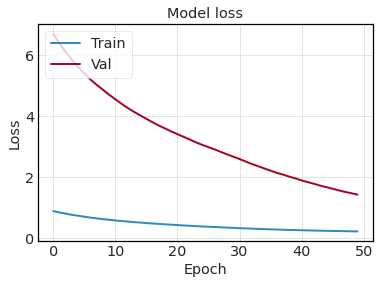

In [254]:
ensemble_model = Ensemble(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[ 8.596502   9.173026   8.540061  11.316076  11.003792  10.234592
 11.937848  10.127768  10.344492   9.072155  10.827165  32.121994
 11.593      9.441176  28.060621  13.399978  10.910087   9.141636
  9.361794  17.020962  10.432346  12.903654  10.924985  10.675463
 10.174794  10.554242  11.313547  12.056366   9.939976   9.386829
 10.079852  12.555601  13.401641   9.507414   8.3944025  8.413875
  9.580249   8.536227   8.406234  25.125444   9.523737   8.986148
  8.3918085 10.554549  11.935492  11.723577   8.9881115 10.070682
 14.379237  12.186403  10.270428   8.714112   8.582679   8.511434
 10.942709  12.328501  10.216443  11.055452   9.817119   9.318052
  8.96221   10.129448   9.105551   8.65275    9.818331  10.278936
  9.620847  10.001403   8.454848   9.601983   8.415343   8.40849
  9.498711   8.469329   8.418274  10.05428    8.517237   8.485506
  8.417986   9.165173   8.651477   8.407512   8.422161  13.041346
 10.453908   8.495237   9

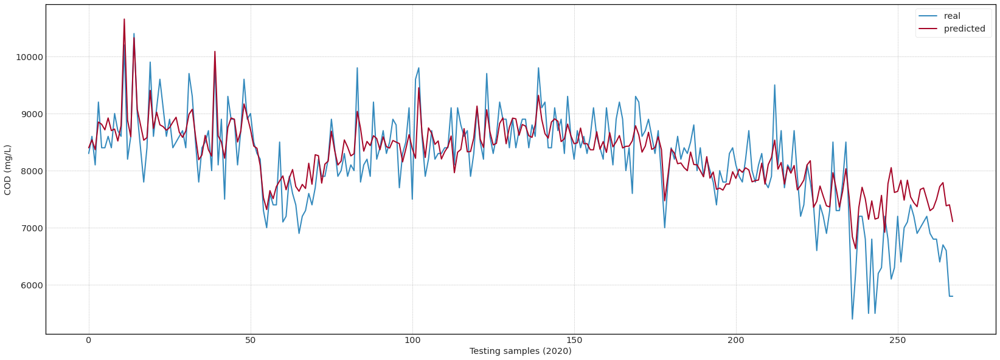

In [255]:
ensemble_model.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 2 - Model Fusion + Exo


Epoch 1/50
8/8 [==============================] - 0s 20ms/step - loss: 0.7921 - MAPE: 172.0357 - val_loss: 0.6191 - val_MAPE: 40.5153
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 0.7570 - MAPE: 170.7412 - val_loss: 0.5648 - val_MAPE: 37.8206
Epoch 3/50
8/8 [==============================] - 0s 4ms/step - loss: 0.7300 - MAPE: 170.6508 - val_loss: 0.5251 - val_MAPE: 35.7750
Epoch 4/50
8/8 [==============================] - 0s 3ms/step - loss: 0.7085 - MAPE: 169.3284 - val_loss: 0.4934 - val_MAPE: 34.1706
Epoch 5/50
8/8 [==============================] - 0s 4ms/step - loss: 0.6890 - MAPE: 168.9494 - val_loss: 0.4741 - val_MAPE: 33.2817
Epoch 6/50
8/8 [==============================] - 0s 5ms/step - loss: 0.6697 - MAPE: 168.6798 - val_loss: 0.4578 - val_MAPE: 32.4443
Epoch 7/50
8/8 [==============================] - 0s 4ms/step - loss: 0.6533 - MAPE: 165.2373 - val_loss: 0.4430 - val_MAPE: 31.4841
Epoch 8/50
8/8 [==============================] - 0s 4ms/step - loss

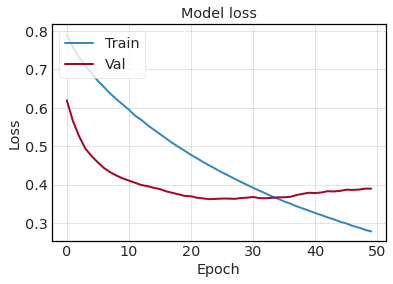

In [256]:
ensemble_model2 = Ensemble2(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model2.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[ 9.318623   9.12461    9.120864   8.633655   9.965206   9.382431
  9.299521   9.231828   9.388646   9.275591   9.695343  11.542173
  9.85992    9.32076   12.9906    11.374111  10.55033    9.683902
  8.945862  12.132023  10.191677  10.556781  10.456208  11.4174795
 11.556738  10.48669   11.053618  10.88552   10.082431   9.670599
 10.094945  10.71906   12.047147  10.472431   8.927644   8.669917
  8.881984   9.017052   8.519842   9.120415   9.515379   9.161615
  9.318061   8.774261  11.030703  10.599504   9.686549   9.776342
 11.572036  11.227155  10.365462   9.75805    9.452918   8.721471
 10.20128   11.113267   8.795434  13.313898  11.7518     9.901592
 13.777529   9.915729  10.066671   8.950787  10.958183  15.999796
 10.938826  10.987339  12.750298  10.815245  10.145466   9.091347
  9.7421255  8.444223   8.5793     8.9473915  8.803965   8.547686
  8.4248     8.420374   8.804878   8.505907   8.526095   8.416415
  8.4224205  8.560764  

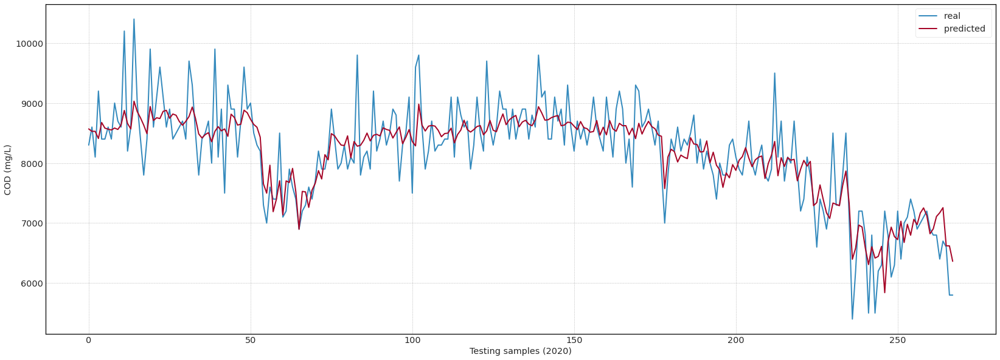

In [257]:
ensemble_model2.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 3 - Model Selection

     0  1  2
0    0  0  1
1    0  1  0
2    0  1  0
3    0  1  0
4    1  0  0
..  .. .. ..
263  0  0  1
264  1  0  0
265  1  0  0
266  1  0  0
267  0  1  0

[268 rows x 3 columns]
(268, 3)
(268, 4)
Epoch 1/50
8/8 [==============================] - 1s 27ms/step - loss: 1.1157 - accuracy: 0.3900 - val_loss: 1.1184 - val_accuracy: 0.4815
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 1.1019 - accuracy: 0.4357 - val_loss: 1.1114 - val_accuracy: 0.4815
Epoch 3/50
8/8 [==============================] - 0s 4ms/step - loss: 1.0901 - accuracy: 0.4440 - val_loss: 1.1119 - val_accuracy: 0.4815
Epoch 4/50
8/8 [==============================] - 0s 4ms/step - loss: 1.0816 - accuracy: 0.4481 - val_loss: 1.1148 - val_accuracy: 0.4815
Epoch 5/50
8/8 [==============================] - 0s 4ms/step - loss: 1.0749 - accuracy: 0.4440 - val_loss: 1.1218 - val_accuracy: 0.4815
Epoch 6/50
8/8 [==============================] - 0s 4ms/step - loss: 1.0690 - accuracy: 0.4564 - val_loss: 1.1

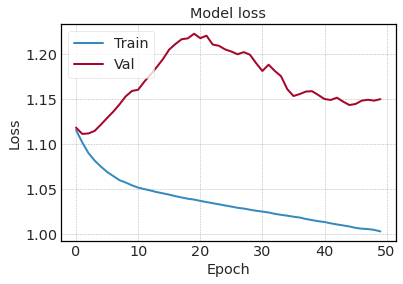

In [258]:
ensemble_model3 = Ensemble3(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model3.training()

     BT_C_MVLSS    model1    model2    model3
0      0.272312  0.827903  0.370351  0.550589
1      0.153453  0.222553  0.551629  0.436745
2      0.510030  0.476260  0.341818  0.713775
3     -0.084266 -0.338851  0.925951  0.130344
4      1.223185  0.429713  0.800264  1.454289
..          ...       ...       ...       ...
263   -1.629435 -1.484629 -0.775786 -1.940368
264   -2.104872 -1.707736 -0.695106 -1.982614
265   -1.748295 -2.078657 -1.986388 -1.853589
266   -1.867154 -2.063925 -1.893657 -2.033599
267   -2.818027 -2.226162 -2.744702 -2.654279

[268 rows x 4 columns]      0  1  2
0    0  0  1
1    0  1  0
2    0  1  0
3    0  1  0
4    1  0  0
..  .. .. ..
263  0  0  1
264  1  0  0
265  1  0  0
266  1  0  0
267  0  1  0

[268 rows x 3 columns]
9/9 [==============================] - 0s 2ms/step - loss: 1.0165 - accuracy: 0.4776
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(4.318346873525963, shape=(), dtype=float64)
MAPEsci:  33832.27705386147
MAPE:  4.318346873525967
R2:  0.7297

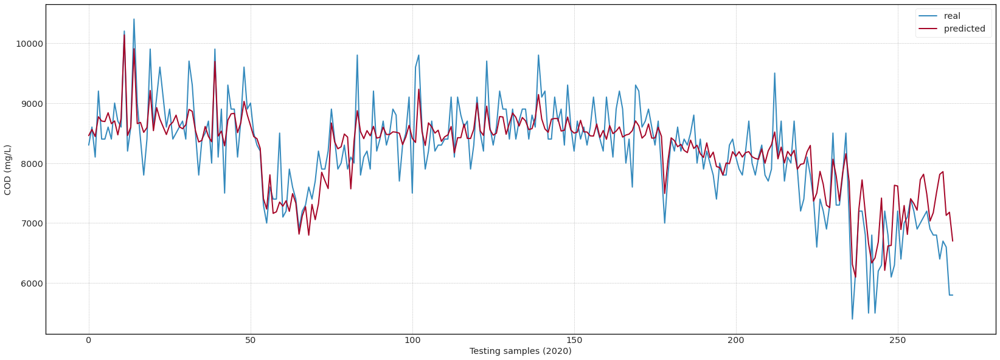

In [259]:
ensemble_model3.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [260]:
ensemble_model3.selection.to_list().count(0)

23

In [261]:
ensemble_model3.full_prediction

array([ 8458.17578125,  8560.453125  ,  8442.07714844,  8771.64648438,
        8700.73339844,  8692.01855469,  8838.61132812,  8656.5859375 ,
        8702.31738281,  8470.43945312,  8743.57519531, 10135.50976562,
        8459.3671875 ,  8598.95019531,  9904.40234375,  8657.47753906,
        8677.79394531,  8512.12890625,  8591.296875  ,  9209.08398438,
        8540.46289062,  8924.921875  ,  8732.59667969,  8604.08496094,
        8475.98535156,  8628.0703125 ,  8682.49902344,  8798.66308594,
        8606.66210938,  8572.00195312,  8637.95019531,  8894.47558594,
        8861.53710938,  8537.4609375 ,  8352.07226562,  8378.78027344,
        8610.36230469,  8443.58105469,  8355.70117188,  9693.47265625,
        8450.1640625 ,  8532.33007812,  8286.97558594,  8713.77636719,
        8820.48925781,  8828.70703125,  8506.60351562,  8673.18359375,
        9028.81640625,  8803.96972656,  8624.98242188,  8442.07128906,
        8406.51953125,  8245.28027344,  7406.42089844,  7233.40625   ,
      

In [262]:
# yavg_train = ensemble.values
# yann_train = ensemble_model2.full_prediction.values
# yann2_train = ensemble_model3.full_prediction
# y_train = app3.Y_test.values

In [263]:
y1_train = app1.full_prediction.values
y2_train = app2.full_prediction.values
y3_train = app3.full_prediction
yavg_train = ensemble.values
yann_train = ensemble_model2.full_prediction.values
yann2_train = ensemble_model3.full_prediction
y_train = app3.Y_test.values

## Testing


*** ANN estimation ***
MAPE:  14.331617248642761
R2:  -1.3327875769236872
RMSE:  807.8836710538142


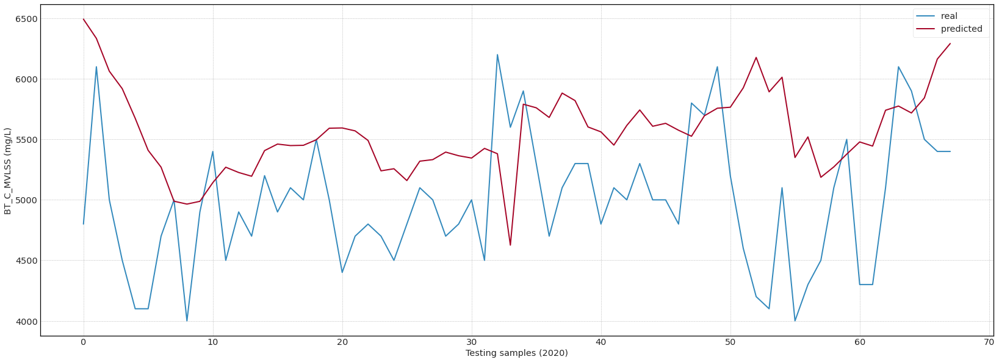

(68,)

In [264]:
app1.testing(dataset.iloc[-(cut_off + 5):])
app1.full_prediction.shape

In [265]:
# yhat_test = app1.full_prediction
# ytest = app1.Y_test

In [266]:
# # yhat_test.value
# xx = np.arange(269, 337)
# len(xx)

*** LSTM estimation ***
MAPE:  19.265720682299285
R2:  -3.7089819186439534
RMSE:  1147.8225293039397


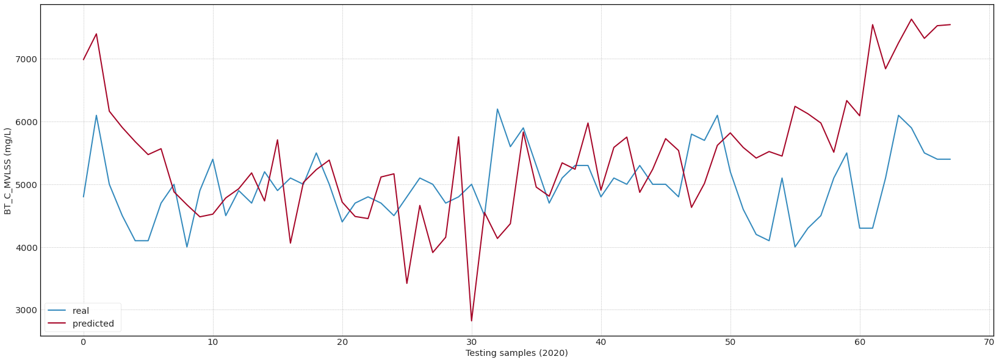

(68, 1)

In [267]:
app2.testing(dataset.iloc[-(cut_off + 7):])
app2.full_prediction.shape

*** Delta estimation ***
MAPE:  31.825359564070173
R2:  -8.20312440344565
RMSE:  1604.644676523383


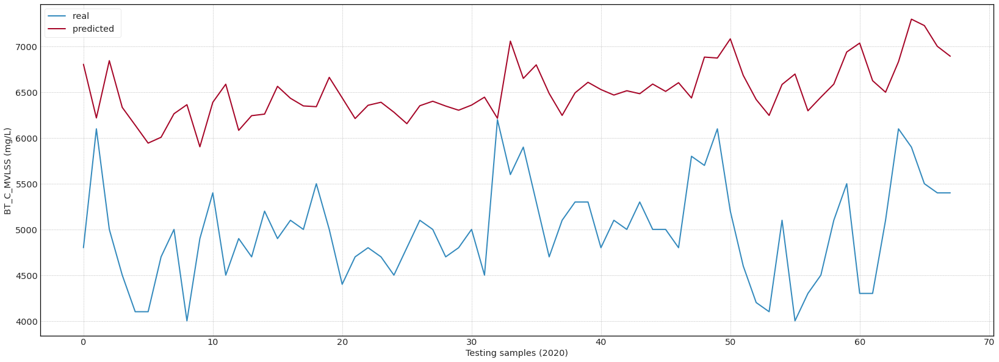

(68,)

In [268]:
app3.testing(dataset.iloc[-cut_off:])
app3.full_prediction.shape

In [269]:
# yhat_test = app3.full_prediction
# ytest = app3.Y_test

# # yhat_test.value
# xx = np.arange(269, 337)
# len(xx)

# fig = plt.figure(figsize=(28,10))
# plt.plot(np.concatenate((y_train, ytest)), 'darkblue', label = 'Measurement')
# # plt.plot(ytrain.values, color='blue')
# plt.plot(y1_train, 'darkorange', label = 'Training Prediction - Mape: 5.81%')
# plt.plot(xx, yhat_test, c='red', label = 'Testing Prediction - Mape: 31.8%')
# plt.axvline(268, linestyle = '--')
# # fig.text(0.83, 0.45, 'Mape: 9.20%',  fontsize=15)
# # fig.text(0.65, 0.2, 'Mape: 5.23%',  fontsize=15)
# # fig.text(0.8, 0.78, 'Mape Training: 5.23%',  fontsize=10)
# # fig.text(0.8, 0.75, 'Mape Testing: 9.20%',  fontsize=10)
# plt.ylabel('MVLSS')
# plt.xlabel('Samples 2018')
# plt.legend()
# plt.show()

*** Ensemble estimation ***
MAPE:  18.96665810933733
R2:  -2.933429601641358


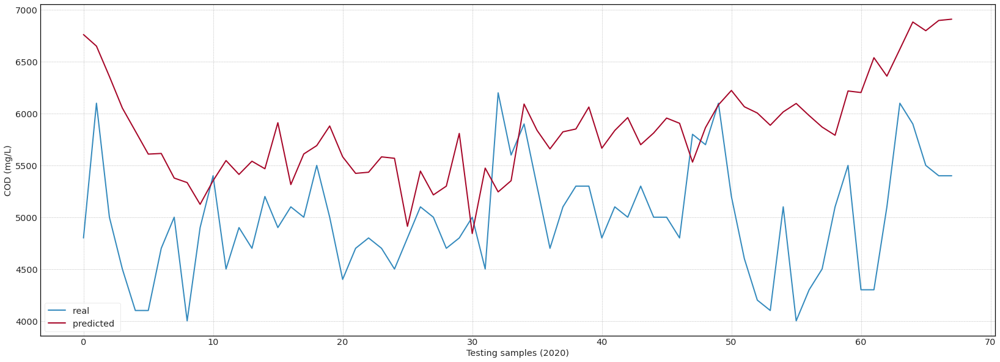

In [270]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble.values))
print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
#print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[48.611988 52.766945 43.290558 37.34021  35.311752 33.602234 36.39122
 35.13039  34.386997 27.4444   31.467937 34.82869  31.378681 35.841972
 29.580065 41.773163 24.451674 32.975555 34.435482 38.360832 29.436865
 25.069792 27.026638 36.306988 35.485985 18.716244 30.695683 23.793924
 24.986391 40.43863  16.190647 29.546764 23.57469  42.071613 40.68073
 33.93923  30.008389 30.717075 32.92102  43.47347  32.558872 39.6673
 40.18253  29.978197 36.005447 39.693966 39.404713 29.26718  36.039658
 41.268177 45.335163 37.29919  30.648071 32.727722 34.04802  49.48913
 42.438744 45.824886 41.932037 52.65314  50.32014  62.105953 49.54841
 56.629635 70.5482   61.95162  57.292145 56.29039 ], shape=(68,), dtype=float32)
MAPEsci:  181362.80014935663
MAPE:  37.87647341724668
R2:  -12.256207097846113
RMSE:  1925.8429740252434


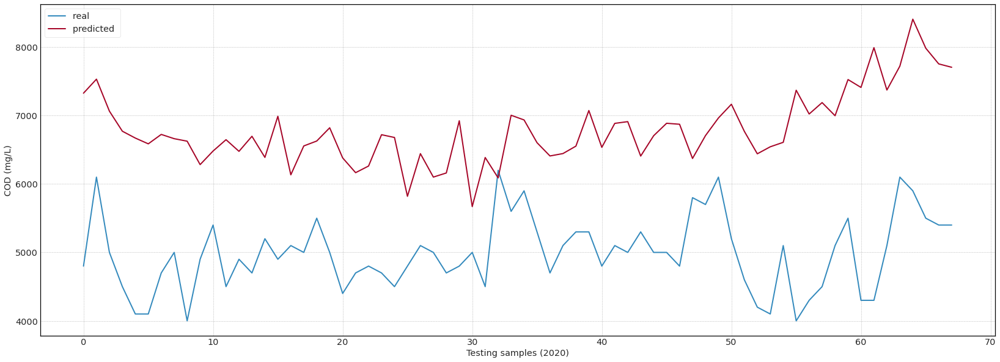

In [271]:
ensemble_model.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[28.05943   30.859528  14.444605  11.605513   9.0856     8.437163
  8.414509  14.6262665 17.59043   18.295662  15.121184  12.5272665
 12.845953  11.773211  11.321427   8.608125  13.068872  10.631362
  8.977224   8.32192    9.578343   9.995913  10.780415   9.929162
 10.033015  23.326672  12.100115  17.556044  15.261597   8.375071
 32.639492  11.511904  14.225891  21.631012  10.250471   8.446044
  9.409337   8.780484   8.543009  10.725185   9.581703   8.723831
  9.642998   8.381051   8.36558   10.006158   9.429062   9.540826
  8.320633  10.359194  11.889933  12.2044735 14.584036  12.270496
 19.254728  12.520327  15.420489  10.92674    9.296654  16.88269
 14.346737  31.825792  25.917038  29.647509  32.262726  31.163618
 37.439404  38.3962   ], shape=(68,), dtype=float32)
MAPE:  14.798750634113036
R2:  -1.5576850743460082
RMSE:  845.9306639622421


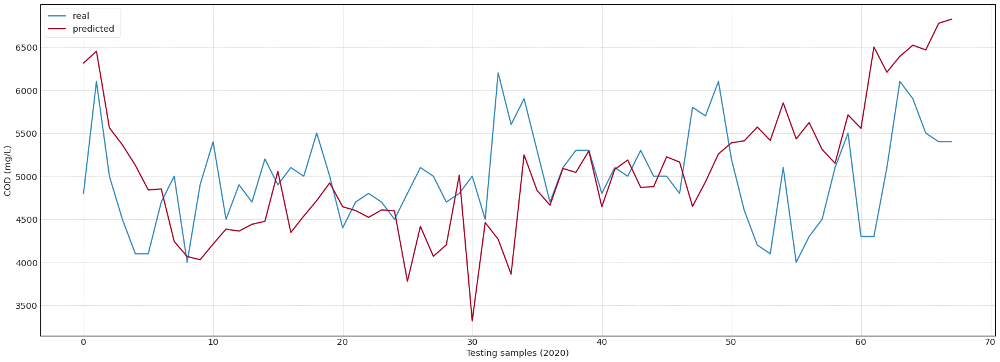

In [272]:
ensemble_model2.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

    BT_C_MVLSS    model1    model2    model3
0    -2.580309 -2.558207 -2.235188 -2.591382
1    -4.006619 -2.804353 -1.506224 -3.728617
2    -2.461450 -3.224873 -3.693286 -2.514244
3    -3.768901 -3.449068 -4.152700 -3.505475
4    -4.363197 -3.828092 -4.553947 -3.881653
..         ...       ...       ...       ...
63   -3.650042 -3.671635 -1.763167 -2.536345
64   -2.461450 -3.760148 -1.091845 -1.634084
65   -2.699168 -3.567424 -1.633905 -1.769668
66   -3.174605 -3.069601 -1.276213 -2.209105
67   -3.293464 -2.870198 -1.246071 -2.419311

[68 rows x 4 columns]      0  1  2
0    0  0  1
1    0  1  0
2    0  1  0
3    0  1  0
4    1  0  0
..  .. .. ..
263  0  0  1
264  1  0  0
265  1  0  0
266  1  0  0
267  0  1  0

[268 rows x 3 columns]
3/3 [==============================] - 0s 3ms/step - loss: 0.9217 - accuracy: 0.5882
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(14.739498761296455, shape=(), dtype=float64)
MAPEsci:  71434.92700913372
MAPE:  14.73949876129645
R2:  -1.793497632613964

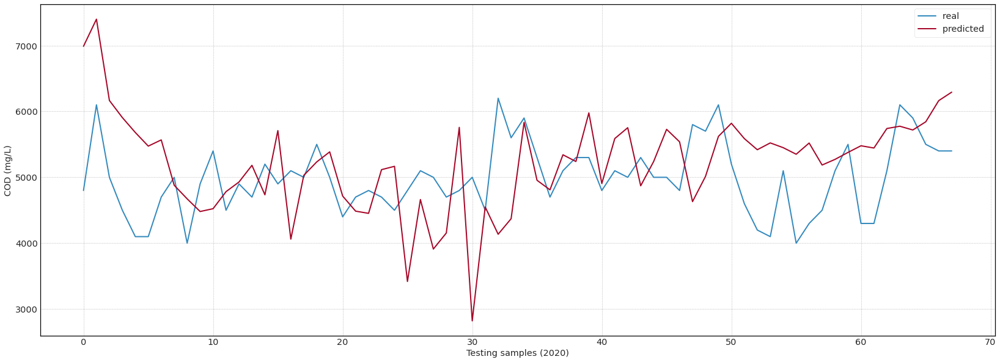

In [273]:
ensemble_model3.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [274]:
ensemble_model3.selection.to_list().count(3)

0

In [275]:
# yavg_test = ensemble.values
# yann_test = ensemble_model2.full_prediction.values
# yann2_test = ensemble_model3.full_prediction
# y_test = app3.Y_test.values

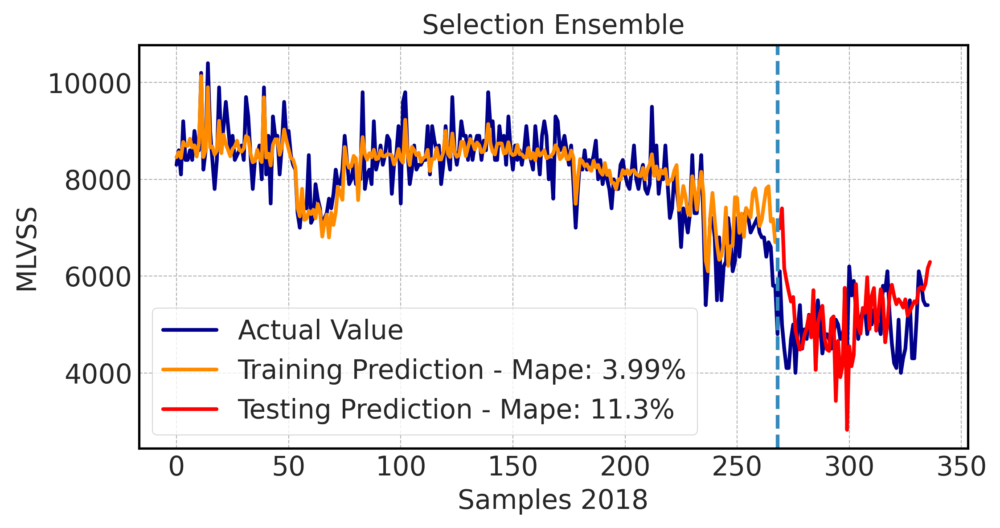

In [284]:
y1_test = app1.full_prediction.values
y2_test = app2.full_prediction.values
y3_test = app3.full_prediction
yavg_test = ensemble.values
yann_test = ensemble_model2.full_prediction.values
yann2_test = ensemble_model3.full_prediction
y_test = app3.Y_test.values

# yhat_test.value
xx = np.arange(269, 337)
len(xx)

fig = plt.figure(figsize=(8,4), dpi=300)
plt.plot(np.concatenate((y_train, y_test)), 'darkblue', label = 'Actual Value')
# plt.plot(ytrain.values, color='blue')
plt.plot(yann2_train, 'darkorange', label = 'Training Prediction - Mape: 3.99%')
plt.plot(xx, yann2_test, c='red', label = 'Testing Prediction - Mape: 11.3%')
plt.axvline(268, linestyle = '--')
# fig.text(0.83, 0.45, 'Mape: 9.20%',  fontsize=15)
# fig.text(0.65, 0.2, 'Mape: 5.23%',  fontsize=15)
# fig.text(0.8, 0.78, 'Mape Training: 5.23%',  fontsize=10)
# fig.text(0.8, 0.75, 'Mape Testing: 9.20%',  fontsize=10)
plt.ylabel('MLVSS')
plt.xlabel('Samples 2018')
plt.legend()
plt.title('Selection Ensemble')
plt.show()

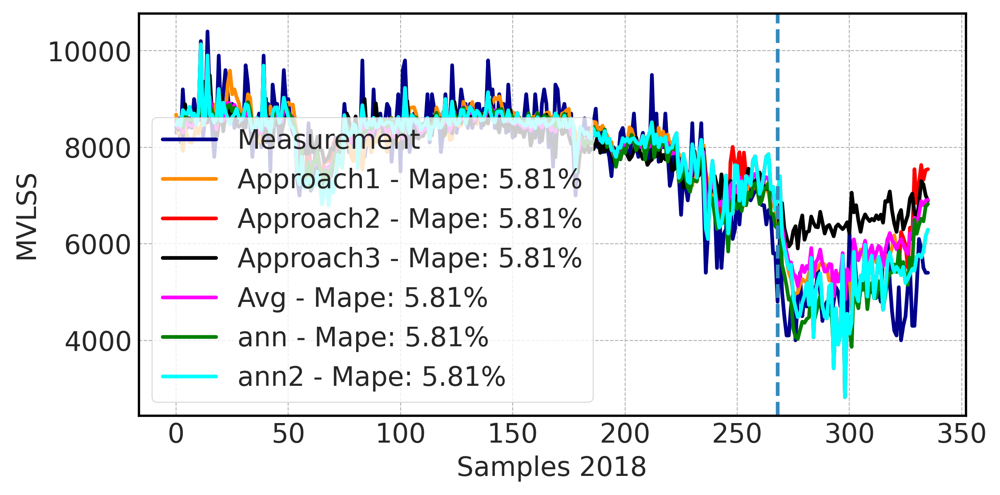

In [278]:
fig = plt.figure(figsize=(28,10))
plt.plot(np.concatenate((y_train, y_test)), 'darkblue', label = 'Measurement')
# plt.plot(ytrain.values, color='blue')
plt.plot(np.concatenate((y1_train, y1_test)), 'darkorange', label = 'Approach1 - Mape: 5.81%')
plt.plot(np.concatenate((y2_train, y2_test)), 'red', label = 'Approach2 - Mape: 5.81%')
plt.plot(np.concatenate((y3_train, y3_test)), 'black', label = 'Approach3 - Mape: 5.81%')
plt.plot(np.concatenate((yavg_train, yavg_test)), 'magenta', label = 'Avg - Mape: 5.81%')
plt.plot(np.concatenate((yann_train, yann_test)), 'green', label = 'ann - Mape: 5.81%')
plt.plot(np.concatenate((yann2_train, yann2_test)), 'cyan', label = 'ann2 - Mape: 5.81%')



plt.axvline(268, linestyle = '--')
# fig.text(0.83, 0.45, 'Mape: 9.20%',  fontsize=15)
# fig.text(0.65, 0.2, 'Mape: 5.23%',  fontsize=15)
# fig.text(0.8, 0.78, 'Mape Training: 5.23%',  fontsize=10)
# fig.text(0.8, 0.75, 'Mape Testing: 9.20%',  fontsize=10)
plt.ylabel('MVLSS')
plt.xlabel('Samples 2018')
plt.legend()
plt.show()

# EQ_COD

In [435]:
active_target = "EQ_COD"
dataset = dataset1.copy()
dataset.shape
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 343 entries, 0 to 342
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DATE        343 non-null    object 
 1   Flow_to_EQ  343 non-null    object 
 2   Flow_efl    343 non-null    float64
 3   BT_C_MLSS   343 non-null    float64
 4   BT_C_MVLSS  343 non-null    float64
 5   BT_N_MLSS   343 non-null    float64
 6   BT_N_MVLSS  343 non-null    float64
 7   D_SS        343 non-null    float64
 8   EQ_N        343 non-null    float64
 9   BT_C_N      343 non-null    float64
 10  BT_N_N      343 non-null    float64
 11  D_N         343 non-null    float64
 12  OxT_PH_PM   343 non-null    float64
 13  EQ_PH       343 non-null    float64
 14  BT_N_PH     343 non-null    float64
 15  D_PH        343 non-null    float64
 16  BT_N_DO     343 non-null    float64
 17  BT_C_DO     343 non-null    float64
 18  Clari_DO    343 non-null    float64
 19  F/M         343 non-null    f

## Approach 1

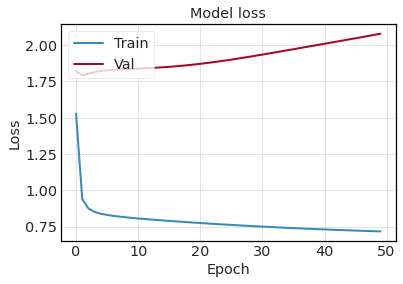

*** ANN estimation ***
MAPE:  9.280911891572655
R2:  0.5231725566667633
RMSE:  39.174632932623275


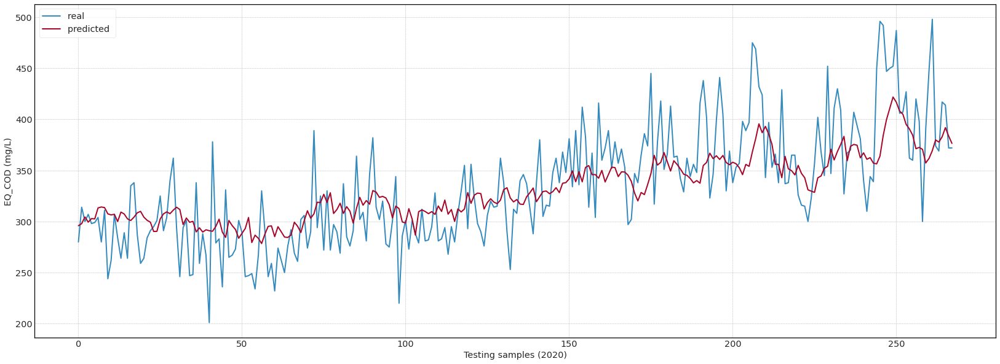

(268,)

In [436]:
cut_off = 68
app1 = approach1(dataset.iloc[:-cut_off], active_target)
# app1.tune()
# print(app1.best_tuned)
# with open('EQ_COD1.pickle', 'wb') as handle:
#   pickle.dump(app1.best_tuned, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open('EQ_COD_tuning_1.pickle', 'wb') as handle:
#   pickle.dump(app1.tune_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
app1.training()
app1.testing(dataset.iloc[2:-cut_off])
# app1.testing(dataset.iloc[-142:])
app1.full_prediction.shape

## Approach 2

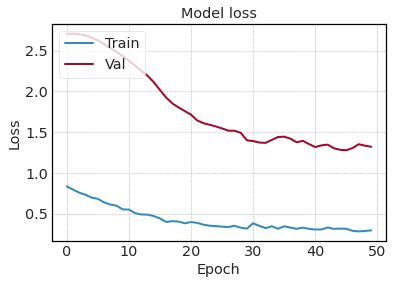

*** LSTM estimation ***
MAPE:  16.171752479039327
R2:  0.6365860102759011
RMSE:  34.19992354503597


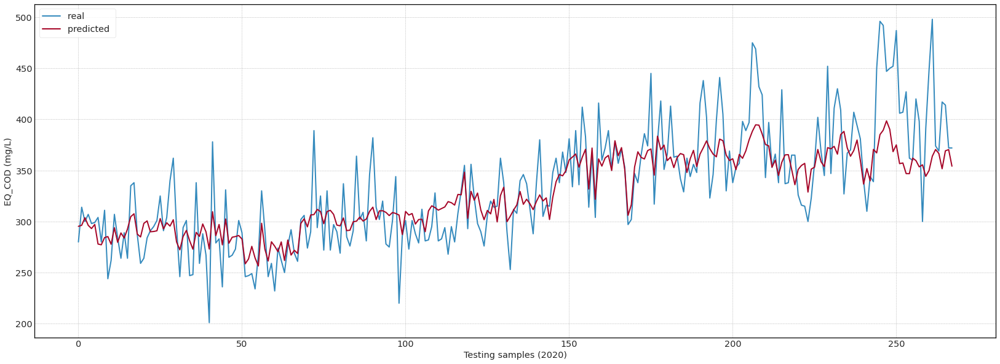

(268, 1)

In [437]:
app2 = approach2(dataset.iloc[:-cut_off], active_target)
app2.series_to_supervised(n_in=7)
app2.supervised
app2.training()
# app2.testing(dataset.iloc[-137:])
app2.testing(dataset.iloc[:-cut_off])
app2.full_prediction.shape

## Approach 3

*** Delta estimation ***
MAPE:  8.491742208199778
R2:  0.5900949513925617
RMSE:  36.321681686626846


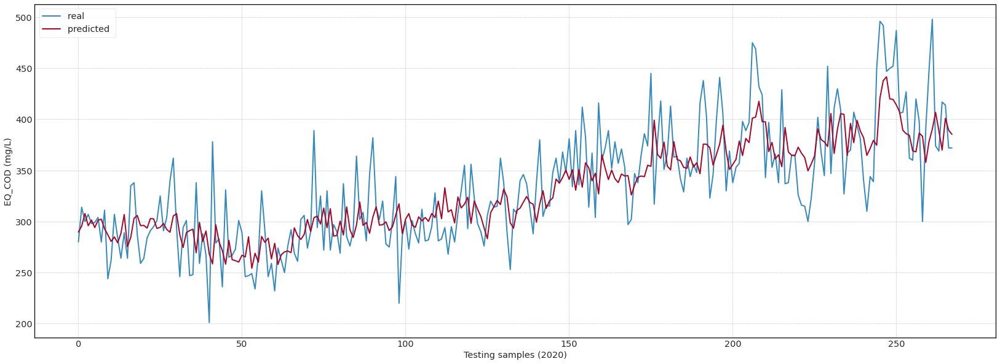

(268,)

In [438]:
app3 = approach3(dataset.iloc[:-cut_off], active_target)
app3.training()
app3.testing(dataset.iloc[7:-cut_off])
# app3.testing(dataset.iloc[-135:])
app3.full_prediction.shape

## Approaches

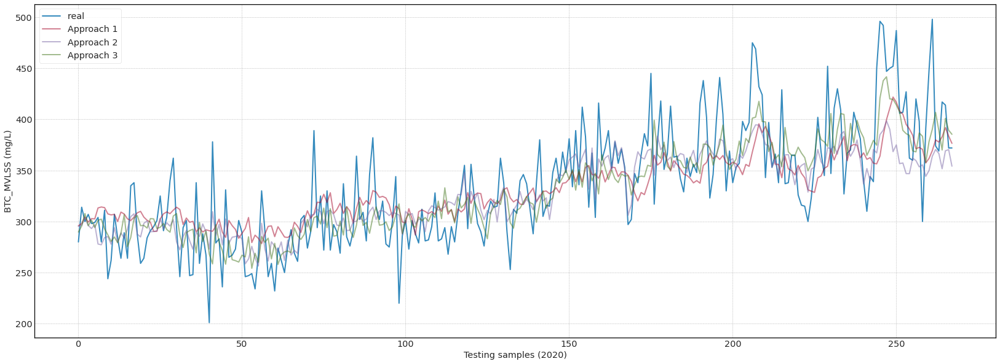

In [439]:
plt.figure(figsize=(28,10))
plt.plot(app1.Y_test.values, label = 'real ')
plt.plot(app1.full_prediction,'-', alpha= 0.5, label = 'Approach 1')
plt.plot(app2.full_prediction['Prediction'], alpha= 0.5, label = 'Approach 2')
plt.plot(app3.full_prediction, alpha= 0.5, label = 'Approach 3')
plt.ylabel('BTC_MVLSS (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

## Ensemble

In [440]:
app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction

0       880.870836
1       889.756728
2       915.997165
3       891.543398
4       897.383597
          ...     
263    1133.412387
264    1104.570116
265    1162.205591
266    1143.379918
267    1116.088418
Length: 268, dtype: float64

### Ensemble AVG

*** Ensemble estimation ***
MAPE:  8.628673410389599
R2:  0.5790705927779687
RMSE:  36.80687516848382


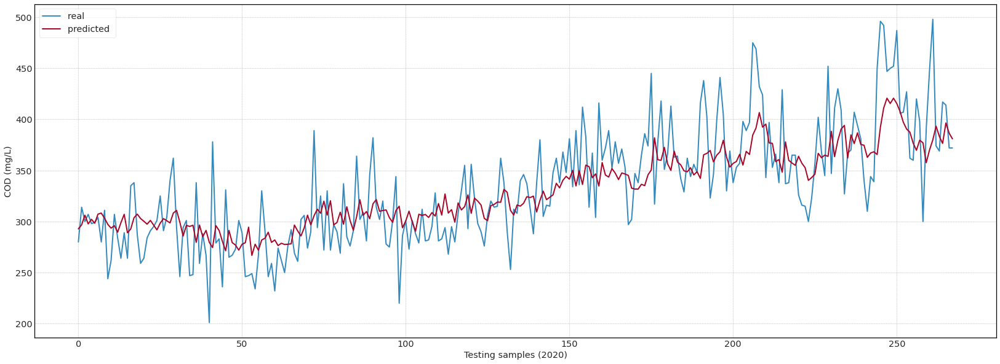

In [441]:
ensemble = (app1.full_prediction + app3.full_prediction)/2
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** Ensemble estimation ***
MAPE:  8.037398457851506
R2:  0.616155305677246
RMSE:  35.14811877830396


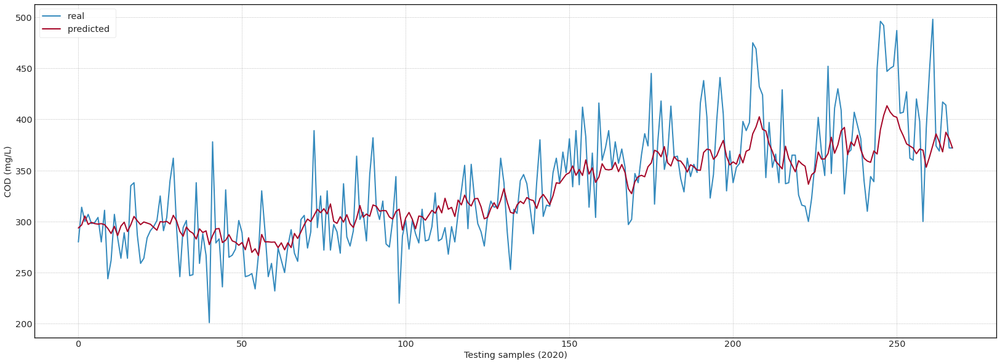

In [442]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

### Ensemble 1 - Model Fusion

Epoch 1/50
8/8 [==============================] - 1s 23ms/step - loss: 0.9360 - MAPE: 182.6987 - val_loss: 4.9663 - val_MAPE: 166.6281
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 0.8514 - MAPE: 174.8895 - val_loss: 4.4870 - val_MAPE: 154.5828
Epoch 3/50
8/8 [==============================] - 0s 4ms/step - loss: 0.7741 - MAPE: 168.5784 - val_loss: 4.0523 - val_MAPE: 142.9746
Epoch 4/50
8/8 [==============================] - 0s 4ms/step - loss: 0.7085 - MAPE: 158.8364 - val_loss: 3.6563 - val_MAPE: 131.7333
Epoch 5/50
8/8 [==============================] - 0s 5ms/step - loss: 0.6505 - MAPE: 151.9785 - val_loss: 3.2959 - val_MAPE: 120.8368
Epoch 6/50
8/8 [==============================] - 0s 4ms/step - loss: 0.5993 - MAPE: 142.0798 - val_loss: 2.9672 - val_MAPE: 110.2160
Epoch 7/50
8/8 [==============================] - 0s 4ms/step - loss: 0.5523 - MAPE: 133.6517 - val_loss: 2.6780 - val_MAPE: 100.2269
Epoch 8/50
8/8 [==============================] - 0s 5ms/step

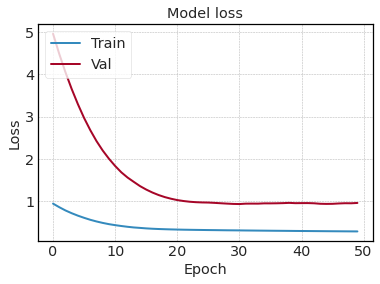

In [443]:
ensemble_model = Ensemble(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[15.3430805 15.243805  14.259603  15.1252775 15.515654  14.695783
 15.335092  15.210082  14.917305  15.707481  16.565645  14.479907
 17.185808  15.061523  16.178318  14.639366  13.837939  13.847181
 15.721022  15.547104  14.520804  14.38743   16.465889  17.475384
 16.825699  14.120626  15.009414  14.069388  14.399822  14.026189
 15.138437  15.837327  16.216152  15.2389555 17.600142  18.57455
 16.011917  17.852808  15.187738  16.723917  19.198872  13.61267
 17.386292  14.312017  18.644997  14.275089  17.37992   15.896591
 16.11328   16.829659  17.288694  21.642925  18.251764  19.35492
 22.223692  24.26766   16.39996   20.494915  20.926172  16.76927
 20.061274  18.634357  17.717886  23.31142   18.261106  21.47059
 18.906551  20.253601  15.220468  14.080593  14.655738  13.761716
 13.789434  13.50247   13.503784  13.545712  13.50428   13.529023
 13.591951  14.017776  14.0128975 13.725406  14.592306  14.7588415
 14.393359  13.870854  13.57

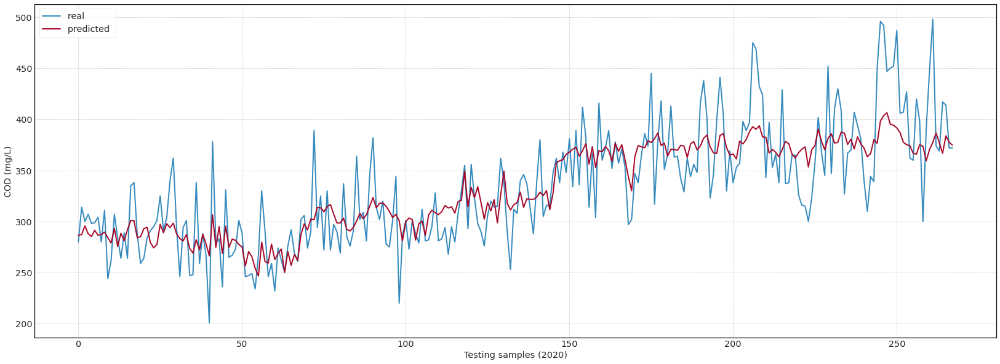

In [444]:
ensemble_model.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 2 - Model Fusion + Exo


Epoch 1/50
8/8 [==============================] - 1s 23ms/step - loss: 0.5479 - MAPE: 126.2499 - val_loss: 1.1855 - val_MAPE: 70.9847
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 0.4980 - MAPE: 137.8161 - val_loss: 1.0259 - val_MAPE: 69.4095
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 0.4574 - MAPE: 144.6380 - val_loss: 0.9112 - val_MAPE: 69.6009
Epoch 4/50
8/8 [==============================] - 0s 4ms/step - loss: 0.4326 - MAPE: 154.5948 - val_loss: 0.8236 - val_MAPE: 70.2451
Epoch 5/50
8/8 [==============================] - 0s 4ms/step - loss: 0.4128 - MAPE: 162.8610 - val_loss: 0.7766 - val_MAPE: 71.8316
Epoch 6/50
8/8 [==============================] - 0s 4ms/step - loss: 0.4017 - MAPE: 170.1520 - val_loss: 0.7474 - val_MAPE: 73.6558
Epoch 7/50
8/8 [==============================] - 0s 4ms/step - loss: 0.3927 - MAPE: 174.3552 - val_loss: 0.7353 - val_MAPE: 74.7508
Epoch 8/50
8/8 [==============================] - 0s 5ms/step - loss

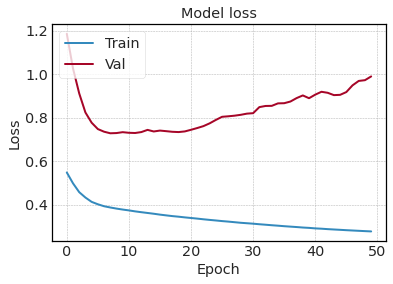

In [445]:
ensemble_model2 = Ensemble2(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model2.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[15.041483  14.718908  14.258972  14.988357  14.781573  14.653442
 15.407904  15.461141  14.995387  16.27881   15.750103  14.554851
 17.780981  15.112832  14.247416  15.967415  14.115292  14.357241
 15.405077  15.036829  13.9069395 14.029074  14.7954855 16.227682
 16.523022  14.424398  15.173168  14.349513  14.98493   14.353447
 16.33999   16.91024   15.838385  15.283637  16.442276  15.702553
 16.115854  17.600248  15.488034  16.184237  18.73168   14.161825
 17.697762  15.029711  18.50354   15.820196  18.460257  17.434212
 17.670946  18.301912  18.867645  21.923456  17.021616  19.614418
 19.42436   21.103418  17.413893  20.242582  19.470736  17.304443
 17.674946  18.595839  18.172974  20.256449  17.282911  19.984589
 17.012644  17.487028  15.523252  14.761183  14.38721   13.923046
 13.723045  13.69001   13.631937  13.77002   13.570407  13.541608
 13.94163   14.81852   14.02155   14.030096  14.484772  14.710699
 14.653082  14.033328  1

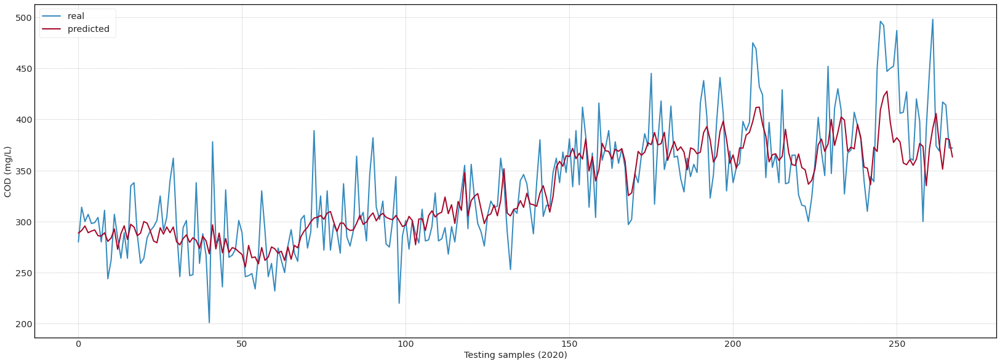

In [446]:
ensemble_model2.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 3 - Model Selection

     0  1  2
0    0  0  1
1    1  0  0
2    0  1  0
3    1  0  0
4    0  0  1
..  .. .. ..
263  0  1  0
264  1  0  0
265  0  0  1
266  0  1  0
267  1  0  0

[268 rows x 3 columns]
(268, 3)
(268, 4)
Epoch 1/50
8/8 [==============================] - 1s 69ms/step - loss: 1.1508 - accuracy: 0.2656 - val_loss: 1.2453 - val_accuracy: 0.3333
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 1.1280 - accuracy: 0.3320 - val_loss: 1.2344 - val_accuracy: 0.2963
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 1.1110 - accuracy: 0.3485 - val_loss: 1.2306 - val_accuracy: 0.2963
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0977 - accuracy: 0.3900 - val_loss: 1.2364 - val_accuracy: 0.2963
Epoch 5/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0866 - accuracy: 0.4066 - val_loss: 1.2357 - val_accuracy: 0.2963
Epoch 6/50
8/8 [==============================] - 0s 4ms/step - loss: 1.0780 - accuracy: 0.4440 - val_loss: 1.2

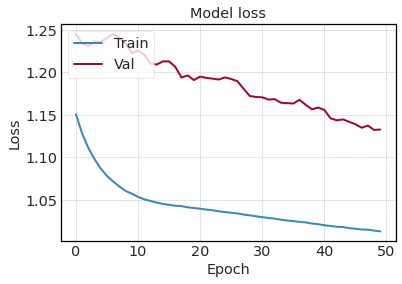

In [447]:
ensemble_model3 = Ensemble3(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model3.training()

       EQ_COD    model1    model2    model3
0   -0.981780 -1.149733 -0.902611 -0.942350
1   -0.929048 -1.084152 -0.874801 -0.804295
2   -0.331414 -0.870963 -0.666493 -0.516680
3   -0.577498 -1.036502 -0.874850 -0.796676
4   -0.454456 -0.924051 -0.963605 -0.666109
..        ...       ...       ...       ...
263  0.723234  1.514073  1.093685  1.391033
264  0.635347  1.682179  0.674369  0.944274
265  1.479065  1.975360  1.166093  1.673667
266  1.426332  1.705743  1.198607  1.398722
267  0.688079  1.474180  0.744846  1.305816

[268 rows x 4 columns]      0  1  2
0    0  0  1
1    1  0  0
2    0  1  0
3    1  0  0
4    0  0  1
..  .. .. ..
263  0  1  0
264  1  0  0
265  0  0  1
266  0  1  0
267  1  0  0

[268 rows x 3 columns]
9/9 [==============================] - 0s 2ms/step - loss: 1.0238 - accuracy: 0.5112
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(7.317426480308003, shape=(), dtype=float64)
MAPEsci:  2474.5969967160763
MAPE:  7.317426480308005
R2:  0.6598325878979321
RMSE:  33.

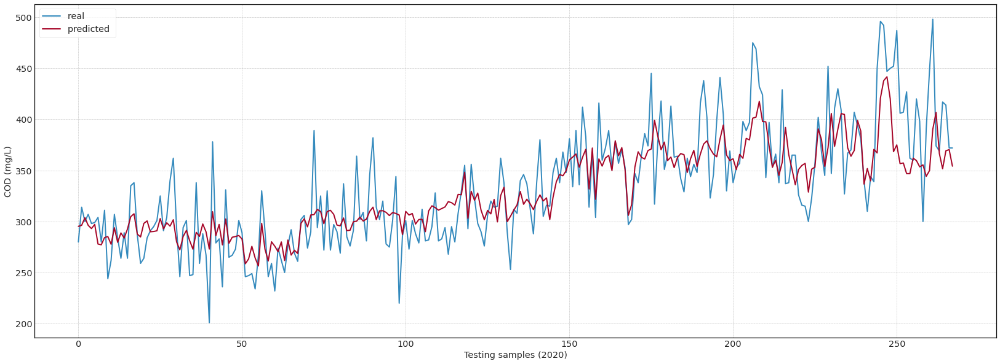

In [448]:
ensemble_model3.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [449]:
ensemble_model3.selection.to_list().count(1)

243

### Ensemble 4

In [450]:
class Ensemble4:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[['model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    # self.Y = self.df['target']
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    # self.y_mean = self.Y.mean()
    # self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
    # self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    from sklearn.svm import SVR
    self.model = SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.2)
    self.model = self.model.fit(self.X_train.values, self.Y_train.values)
  

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target']
    # print(self.Xt)

    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)

    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean


    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [451]:
# ensemble_model4 = Ensemble4(dataset.iloc[:-135], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
# ensemble_model4.training()

In [452]:
y3_train = app3.full_prediction
y3_train

array([289.69931623, 295.5759387 , 307.81893894, 295.90026406,
       301.45813952, 294.07863805, 301.17335716, 302.30387983,
       292.85912058, 286.94309678, 280.52959715, 284.84250195,
       279.18048209, 288.40622031, 306.77290379, 275.33889252,
       284.4085461 , 303.10666991, 305.88113579, 295.93246717,
       296.17683202, 293.58627048, 302.83714296, 302.57869452,
       293.21481167, 294.32123437, 298.09613408, 292.22844231,
       289.52375678, 305.35464081, 307.78783803, 286.94310712,
       274.52378186, 289.05629053, 291.1167759 , 292.47219268,
       269.35112948, 299.16623868, 280.41915467, 290.75419493,
       268.07779446, 258.52448765, 296.77863522, 280.04500038,
       271.47461495, 258.21182303, 281.5570547 , 262.62280201,
       261.6687515 , 260.30627743, 267.0021071 , 265.30868542,
       284.98330002, 254.20177604, 268.93469695, 260.18315637,
       285.3704186 , 279.62301981, 283.69452412, 263.41601889,
       278.67694918, 257.98997038, 267.44807285, 270.28

In [453]:
y1_train = app1.full_prediction.values
y2_train = app2.full_prediction.values
y3_train = app3.full_prediction
yavg_train = ensemble.values
yann_train = ensemble_model2.full_prediction.values
yann2_train = ensemble_model3.full_prediction
y_train = app3.Y_test.values

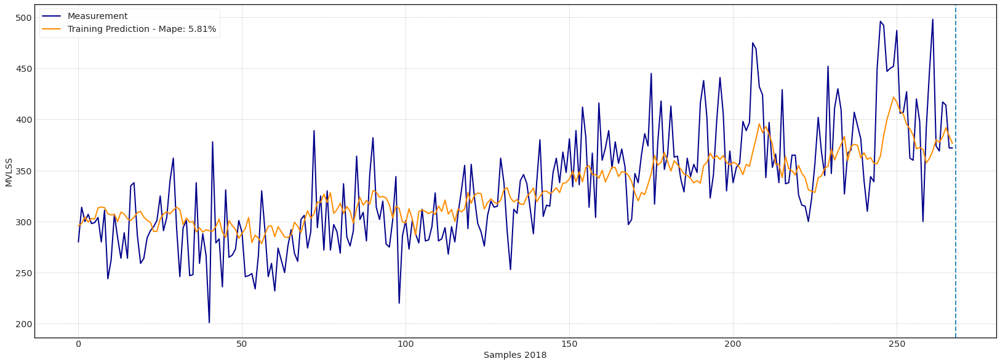

In [454]:
yhat_test = app3.full_prediction
ytest = app3.Y_test

# yhat_test.value
xx = np.arange(269, 337)
len(xx)

fig = plt.figure(figsize=(28,10))
# plt.plot(np.concatenate((y_train, ytest)), 'darkblue', label = 'Measurement')
plt.plot(y_train, 'darkblue', label = 'Measurement')
# plt.plot(y_train, color='blue')
plt.plot(y1_train, 'darkorange', label = 'Training Prediction - Mape: 5.81%')
# plt.plot(xx, yhat_test, c='red', label = 'Testing Prediction - Mape: 31.8%')
plt.axvline(268, linestyle = '--')
# fig.text(0.83, 0.45, 'Mape: 9.20%',  fontsize=15)
# fig.text(0.65, 0.2, 'Mape: 5.23%',  fontsize=15)
# fig.text(0.8, 0.78, 'Mape Training: 5.23%',  fontsize=10)
# fig.text(0.8, 0.75, 'Mape Testing: 9.20%',  fontsize=10)
plt.ylabel('MVLSS')
plt.xlabel('Samples 2018')
plt.legend()
plt.show()

## Testing


*** ANN estimation ***
MAPE:  6.0660267656912925
R2:  -0.08132602673137512
RMSE:  30.36583494716897


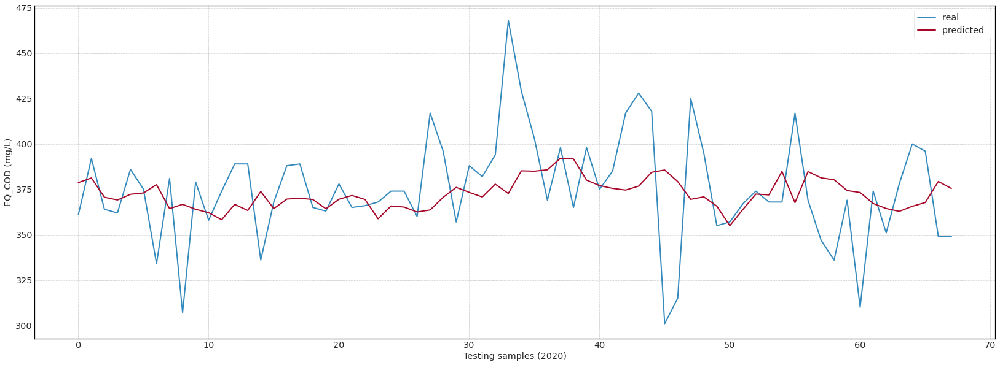

(68,)

In [455]:
app1.testing(dataset.iloc[-(cut_off + 5):])
app1.full_prediction.shape

*** LSTM estimation ***
MAPE:  6.875540348411779
R2:  -0.39863070873746453
RMSE:  34.53491796557592


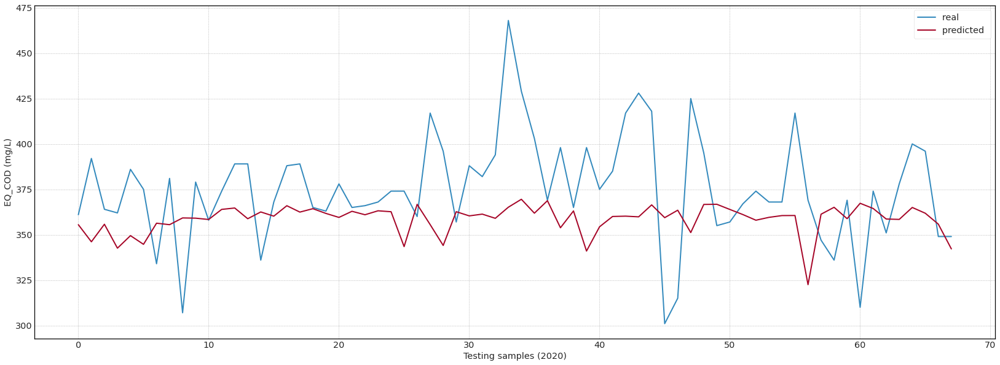

(68, 1)

In [456]:
app2.testing(dataset.iloc[-(cut_off + 7):])
app2.full_prediction.shape

*** Delta estimation ***
MAPE:  5.670749237290998
R2:  0.022310335400728243
RMSE:  28.87403051091999


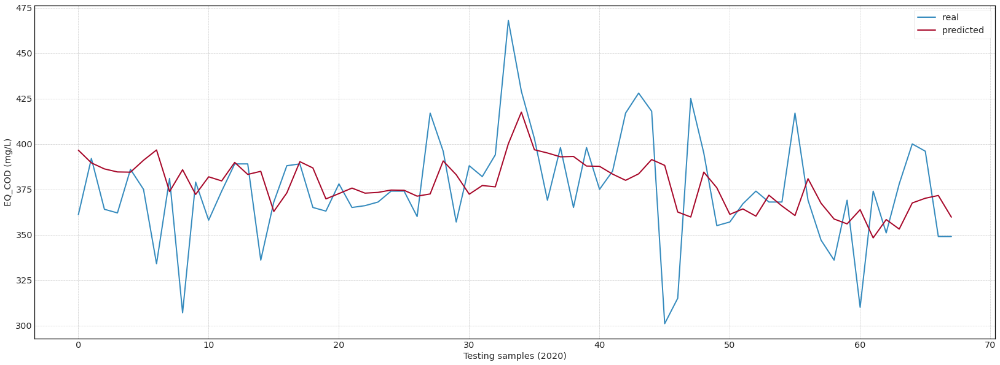

(68,)

In [457]:
app3.testing(dataset.iloc[-cut_off:])
app3.full_prediction.shape

*** Ensemble estimation ***
MAPE:  5.860051455907331


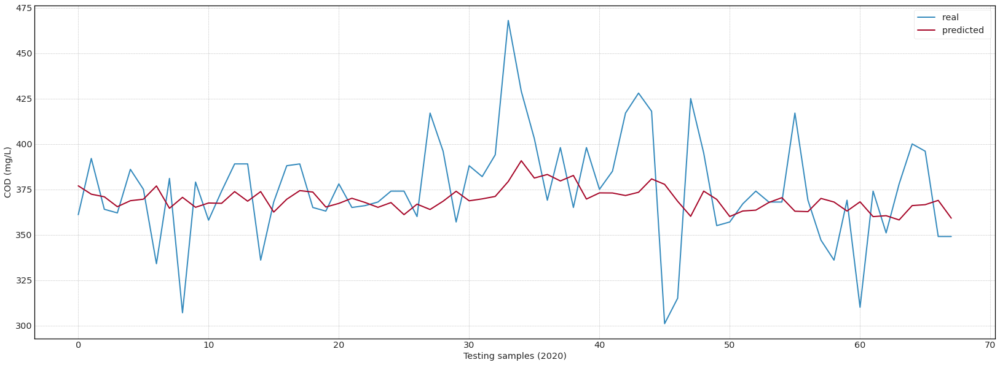

In [458]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble.values))
#print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[6.134784  5.86511   5.7792106 5.7384105 5.7382817 5.889365  6.1395254
 5.754623  5.77163   5.779098  5.7387395 5.76072   5.8964567 5.7384567
 5.767651  6.098973  5.7487845 5.9081135 5.8139124 5.842194  5.7605386
 5.7397914 5.756055  5.7390275 5.7400756 5.758703  5.739086  5.781028
 5.873621  5.738283  5.761401  5.7395506 5.7396593 6.3156404 7.452792
 6.182109  6.1359196 6.010716  6.051472  5.8009853 5.8258862 5.7382684
 5.7389574 5.7382298 5.9818473 5.866535  6.119896  6.3795896 5.763163
 5.739283  5.739295  5.968127  6.3015423 5.777654  5.9497757 6.282355
 5.7393403 5.898123  6.3340383 6.570603  6.0503983 6.40556   6.3788033
 6.47237   5.784005  5.8280754 5.780152  6.41461  ], shape=(68,), dtype=float32)
MAPEsci:  2119.0038344439336
MAPE:  5.9453967023634275
R2:  0.042901807774470724
RMSE:  28.568349278656132


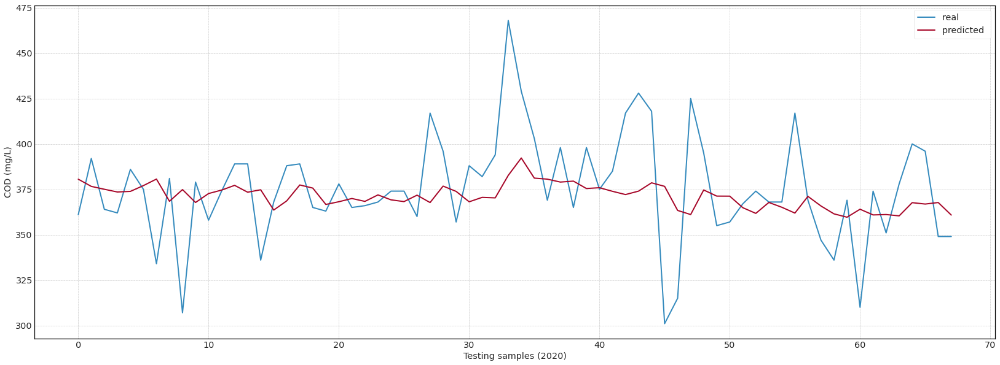

In [459]:
ensemble_model.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[ 5.7386413  8.592739   5.7506094  7.98671    7.1761465  6.3016496
  5.8324976  7.7776694  5.8853064  9.473152   5.878995   5.7385097
  6.083101   5.986298   5.791866   6.8904257  5.7397647  6.1191854
  6.1071663  5.7532897  5.94916    5.7397947  5.8508234  5.785373
  5.739276   6.830557   5.7746987  6.0049086  5.738388   5.738246
  6.261775   5.7390475  5.9952235  6.731815   9.46216    6.1448693
  6.039686   7.3734274  5.739676   9.19314    5.739332   5.739934
  5.739804   5.7966347  6.144123   5.73892   10.669117  11.041678
  6.5419426  5.999845   5.7397575  6.056772   7.1047125  5.973259
  7.614864   6.4015737  8.93578    7.0004673  7.8959785  8.499987
  6.109399   8.590356   6.3351045  7.1397095  5.739614   5.7389793
  6.365205  10.275325 ], shape=(68,), dtype=float32)
MAPE:  6.692705060572352
R2:  -0.11928729766961754
RMSE:  30.894252131081608


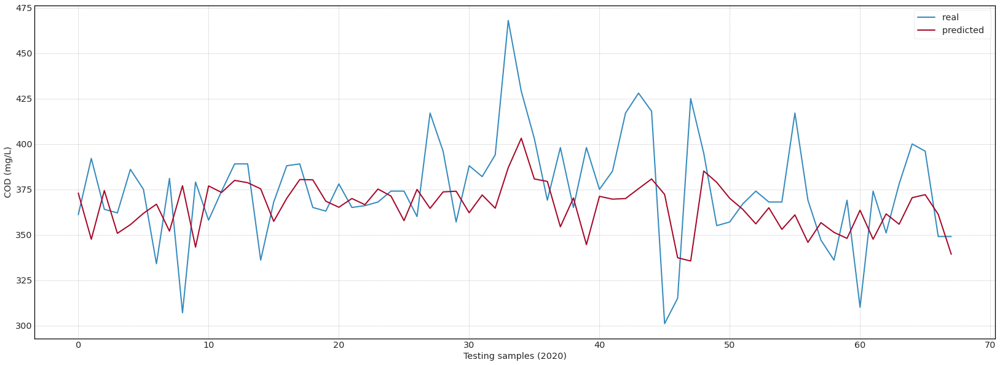

In [460]:
ensemble_model2.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

      EQ_COD    model1    model2    model3
0   1.022051  1.545230  0.782486  1.568013
1   0.494727  1.628909  0.518973  1.403760
2   1.039628  1.283417  0.789153  1.325569
3   0.547459  1.233719  0.420726  1.286486
4   0.512304  1.335444  0.613631  1.283244
..       ...       ...       ...       ...
63  0.318952  1.029884  0.863903  0.547106
64  0.793544  1.120134  1.047909  0.884948
65  1.180248  1.188105  0.958913  0.945981
66  1.109938  1.565297  0.790962  0.981748
67  0.283797  1.439970  0.409634  0.701684

[68 rows x 4 columns]      0  1  2
0    0  0  1
1    1  0  0
2    0  1  0
3    1  0  0
4    0  0  1
..  .. .. ..
263  0  1  0
264  1  0  0
265  0  0  1
266  0  1  0
267  1  0  0

[268 rows x 3 columns]
3/3 [==============================] - 0s 4ms/step - loss: 1.1821 - accuracy: 0.2941
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(6.561899570569733, shape=(), dtype=float64)
MAPEsci:  2484.0151988621506
MAPE:  6.561899570569733
R2:  -0.1965385041389307
RMSE:  31.942598175196

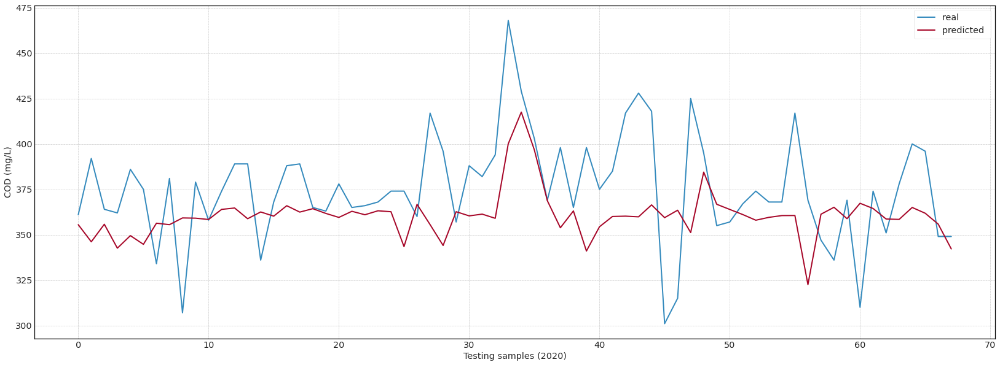

In [461]:
ensemble_model3.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [462]:
ensemble_model3.selection.to_list().count(3)

0

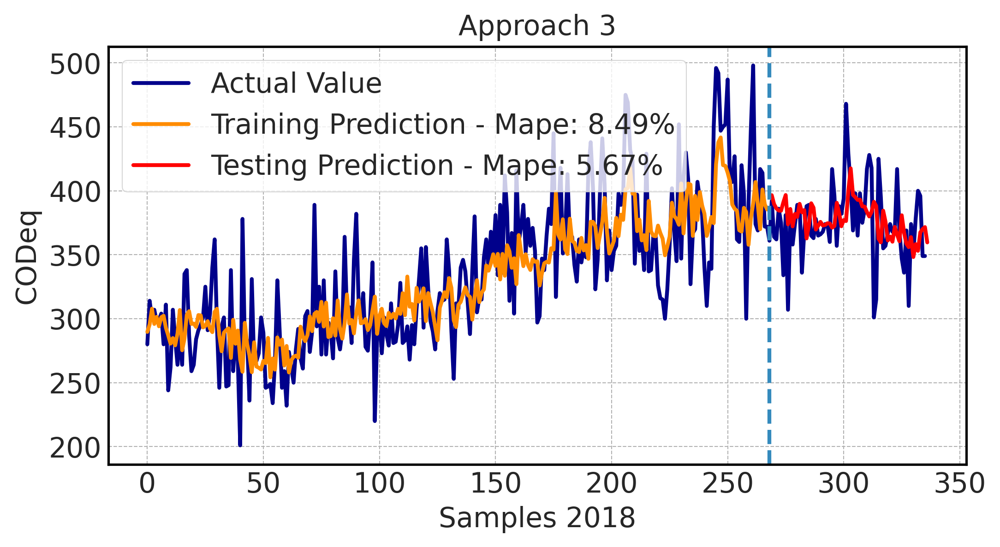

In [471]:
y1_test = app1.full_prediction.values
y2_test = app2.full_prediction.values
y3_test = app3.full_prediction
yavg_test = ensemble.values
yann_test = ensemble_model2.full_prediction.values
yann2_test = ensemble_model3.full_prediction
y_test = app3.Y_test.values

# yhat_test.value
xx = np.arange(269, 337)
len(xx)

fig = plt.figure(figsize=(8,4), dpi=300)
plt.plot(np.concatenate((y_train, y_test)), 'darkblue', label = 'Actual Value')
# plt.plot(ytrain.values, color='blue')
plt.plot(y3_train, 'darkorange', label = 'Training Prediction - Mape: 8.49%')
plt.plot(xx, y3_test, c='red', label = 'Testing Prediction - Mape: 5.67%')
plt.axvline(268, linestyle = '--')
# fig.text(0.83, 0.45, 'Mape: 9.20%',  fontsize=15)
# fig.text(0.65, 0.2, 'Mape: 5.23%',  fontsize=15)
# fig.text(0.8, 0.78, 'Mape Training: 5.23%',  fontsize=10)
# fig.text(0.8, 0.75, 'Mape Testing: 9.20%',  fontsize=10)
plt.ylabel('CODeq')
plt.xlabel('Samples 2018')
plt.legend()
plt.title('Approach 3')
plt.show()

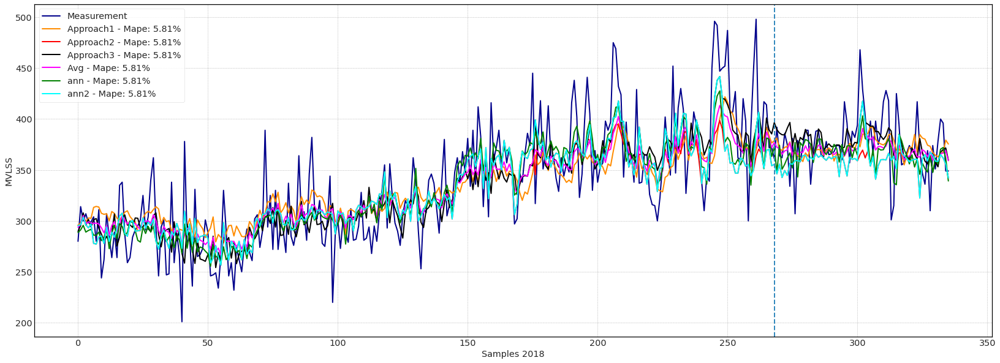

In [464]:
fig = plt.figure(figsize=(28,10))
plt.plot(np.concatenate((y_train, y_test)), 'darkblue', label = 'Measurement')
# plt.plot(ytrain.values, color='blue')
plt.plot(np.concatenate((y1_train, y1_test)), 'darkorange', label = 'Approach1 - Mape: 5.81%')
plt.plot(np.concatenate((y2_train, y2_test)), 'red', label = 'Approach2 - Mape: 5.81%')
plt.plot(np.concatenate((y3_train, y3_test)), 'black', label = 'Approach3 - Mape: 5.81%')
plt.plot(np.concatenate((yavg_train, yavg_test)), 'magenta', label = 'Avg - Mape: 5.81%')
plt.plot(np.concatenate((yann_train, yann_test)), 'green', label = 'ann - Mape: 5.81%')
plt.plot(np.concatenate((yann2_train, yann2_test)), 'cyan', label = 'ann2 - Mape: 5.81%')



plt.axvline(268, linestyle = '--')
# fig.text(0.83, 0.45, 'Mape: 9.20%',  fontsize=15)
# fig.text(0.65, 0.2, 'Mape: 5.23%',  fontsize=15)
# fig.text(0.8, 0.78, 'Mape Training: 5.23%',  fontsize=10)
# fig.text(0.8, 0.75, 'Mape Testing: 9.20%',  fontsize=10)
plt.ylabel('MVLSS')
plt.xlabel('Samples 2018')
plt.legend()
plt.show()

# D_COD_ON

In [ ]:
active_target = "D_COD_ON"
dataset = dataset1.copy()
dataset.shape
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 343 entries, 0 to 342
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DATE        343 non-null    object 
 1   Flow_to_EQ  343 non-null    object 
 2   Flow_efl    343 non-null    float64
 3   BT_C_MLSS   343 non-null    float64
 4   BT_C_MVLSS  343 non-null    float64
 5   BT_N_MLSS   343 non-null    float64
 6   BT_N_MVLSS  343 non-null    float64
 7   D_SS        343 non-null    float64
 8   EQ_N        343 non-null    float64
 9   BT_C_N      343 non-null    float64
 10  BT_N_N      343 non-null    float64
 11  D_N         343 non-null    float64
 12  OxT_PH_PM   343 non-null    float64
 13  EQ_PH       343 non-null    float64
 14  BT_N_PH     343 non-null    float64
 15  D_PH        343 non-null    float64
 16  BT_N_DO     343 non-null    float64
 17  BT_C_DO     343 non-null    float64
 18  Clari_DO    343 non-null    float64
 19  F/M         343 non-null    f

## Approach 1

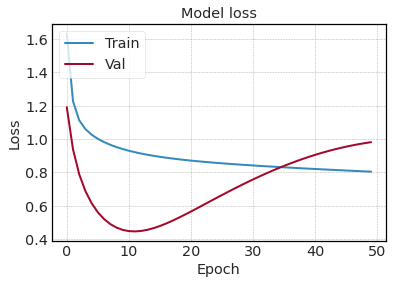

*** ANN estimation ***
MAPE:  11.687432393562771
R2:  0.48635952981207875
RMSE:  18.60099170683657


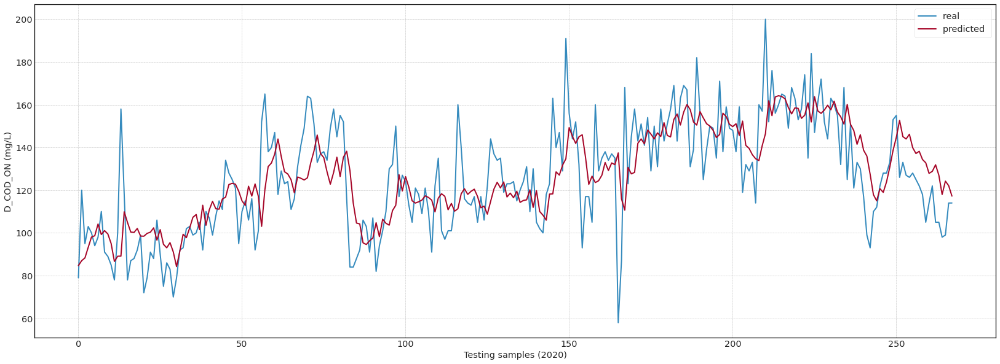

(268,)

In [ ]:
cut_off = 68
app1 = approach1(dataset.iloc[:-cut_off], active_target)
# app1.tune()
# print(app1.best_tuned)
# with open('EQ_COD1.pickle', 'wb') as handle:
#   pickle.dump(app1.best_tuned, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open('EQ_COD_tuning_1.pickle', 'wb') as handle:
#   pickle.dump(app1.tune_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
app1.training()
app1.testing(dataset.iloc[2:-cut_off])
# app1.testing(dataset.iloc[-142:])
app1.full_prediction.shape

## Approach 2

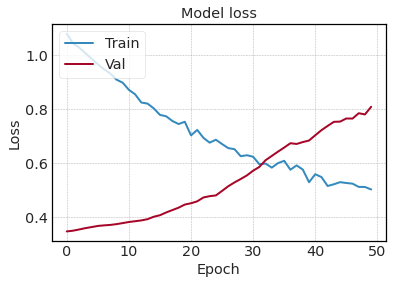

*** LSTM estimation ***
MAPE:  21.07542754380149
R2:  0.4381304113084512
RMSE:  19.454686863349163


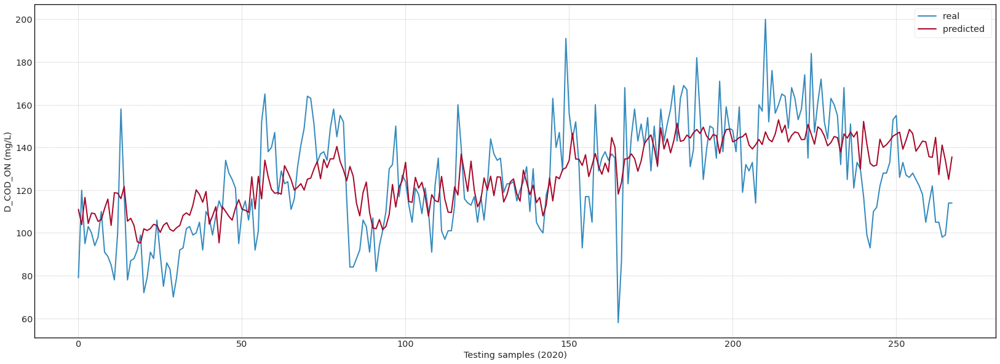

(268, 1)

In [ ]:
app2 = approach2(dataset.iloc[:-cut_off], active_target)
app2.series_to_supervised(n_in=7)
app2.supervised
app2.training(max_epochs=50)
# app2.testing(dataset.iloc[-137:])
app2.testing(dataset.iloc[:-cut_off])
app2.full_prediction.shape

## Approach 3

*** Delta estimation ***
MAPE:  10.707851305976293
R2:  0.5425029999885738
RMSE:  17.55499083167799


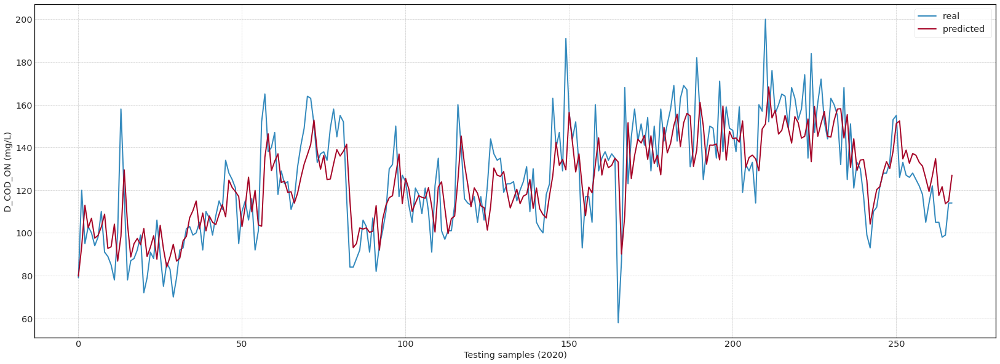

(268,)

In [ ]:
app3 = approach3(dataset.iloc[:-cut_off], active_target)
app3.training()
app3.testing(dataset.iloc[7:-cut_off])
# app3.testing(dataset.iloc[-135:])
app3.full_prediction.shape

## Approaches

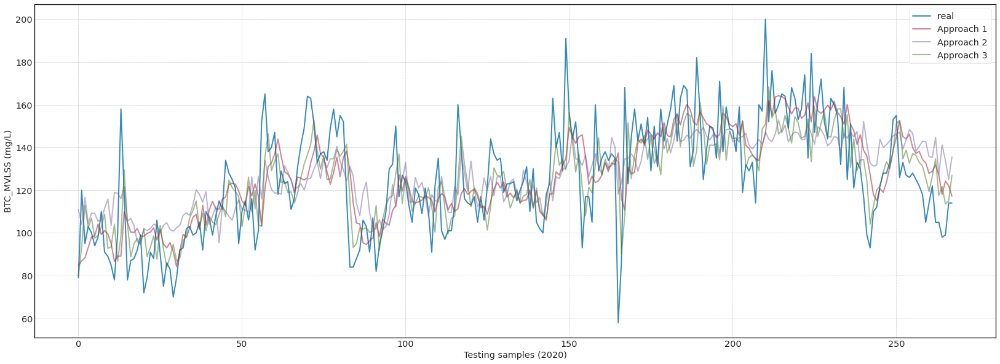

In [ ]:
plt.figure(figsize=(28,10))
plt.plot(app1.Y_test.values, label = 'real ')
plt.plot(app1.full_prediction,'-', alpha= 0.5, label = 'Approach 1')
plt.plot(app2.full_prediction['Prediction'], alpha= 0.5, label = 'Approach 2')
plt.plot(app3.full_prediction, alpha= 0.5, label = 'Approach 3')
plt.ylabel('BTC_MVLSS (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

## Ensemble

In [ ]:
app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction

0      275.555595
1      284.519015
2      317.786025
3      300.080983
4      314.187430
          ...    
263    371.833559
264    380.741347
265    371.861596
266    362.092956
267    379.789030
Length: 268, dtype: float64

### Ensemble AVG

*** Ensemble estimation ***
MAPE:  10.846541316987254
R2:  0.5419944683714414
RMSE:  17.56474476282264


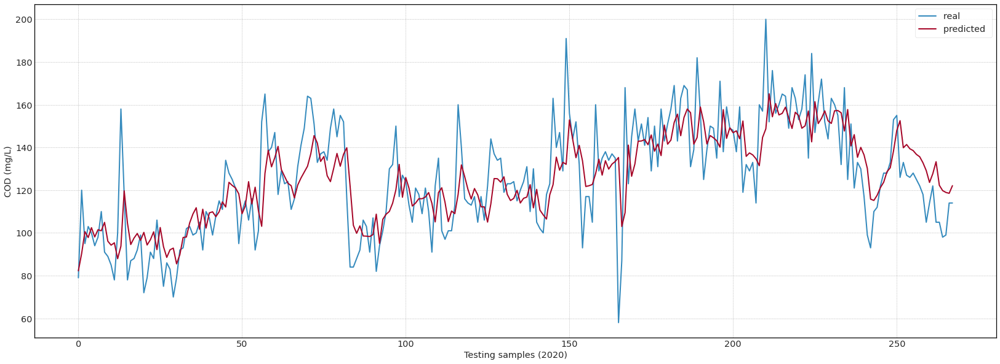

In [ ]:
ensemble = (app1.full_prediction + app3.full_prediction)/2
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** Ensemble estimation ***
MAPE:  10.719912946156693
R2:  0.5754621258008804
RMSE:  16.910821372905417


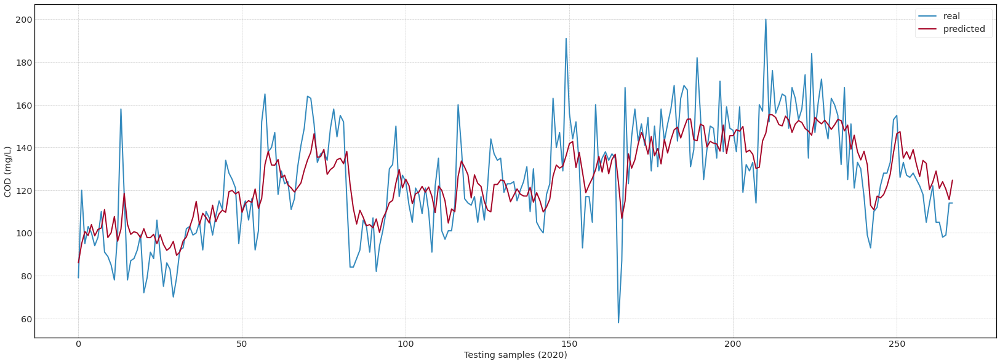

In [ ]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

### Ensemble 1 - Model Fusion

Epoch 1/50
8/8 [==============================] - 0s 19ms/step - loss: 1.6964 - MAPE: 167.5671 - val_loss: 0.5769 - val_MAPE: 583.9061
Epoch 2/50
8/8 [==============================] - 0s 5ms/step - loss: 1.5393 - MAPE: 156.6848 - val_loss: 0.5312 - val_MAPE: 533.3488
Epoch 3/50
8/8 [==============================] - 0s 4ms/step - loss: 1.4058 - MAPE: 149.0079 - val_loss: 0.4920 - val_MAPE: 483.5274
Epoch 4/50
8/8 [==============================] - 0s 4ms/step - loss: 1.2777 - MAPE: 138.5128 - val_loss: 0.4598 - val_MAPE: 435.5288
Epoch 5/50
8/8 [==============================] - 0s 4ms/step - loss: 1.1722 - MAPE: 128.7467 - val_loss: 0.4326 - val_MAPE: 387.7541
Epoch 6/50
8/8 [==============================] - 0s 4ms/step - loss: 1.0754 - MAPE: 120.4097 - val_loss: 0.4117 - val_MAPE: 343.3590
Epoch 7/50
8/8 [==============================] - 0s 4ms/step - loss: 0.9917 - MAPE: 115.2665 - val_loss: 0.3954 - val_MAPE: 310.6839
Epoch 8/50
8/8 [==============================] - 0s 5ms/step

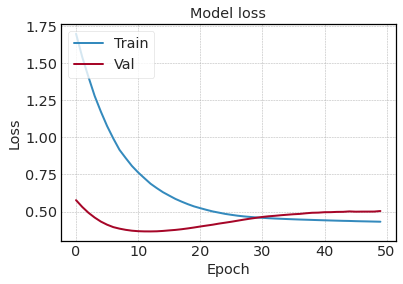

In [ ]:
ensemble_model = Ensemble(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[34.534714 27.727123 28.629414 25.686316 23.802052 26.594683 23.478933
 24.05077  19.0704   25.911829 23.379835 20.198982 25.329575 22.231764
 18.476795 23.017813 22.212673 23.392607 24.748346 25.800854 24.017021
 22.955828 25.684685 24.979193 25.42232  27.533907 29.461012 29.753914
 30.240187 28.505825 33.661125 30.792376 27.39865  25.153667 23.583395
 21.58562  18.102547 22.03772  19.692944 18.945131 23.50067  17.784443
 21.738512 20.143656 20.012989 19.51923  17.956089 17.771904 17.77715
 17.837402 18.392004 18.234385 19.409561 17.949406 17.99554  17.918161
 18.287886 20.136316 25.813385 22.642084 23.678114 25.255207 20.018488
 20.948353 18.474648 17.863258 18.328663 18.258245 18.248636 21.901342
 22.107841 27.038994 30.035267 25.77171  23.200535 25.895819 21.172102
 19.597271 23.237604 23.478048 24.266226 23.540005 27.147564 18.765501
 17.788284 20.187773 18.228153 18.87221  21.344957 20.721306 22.967514
 22.865011 22.439709 20.70

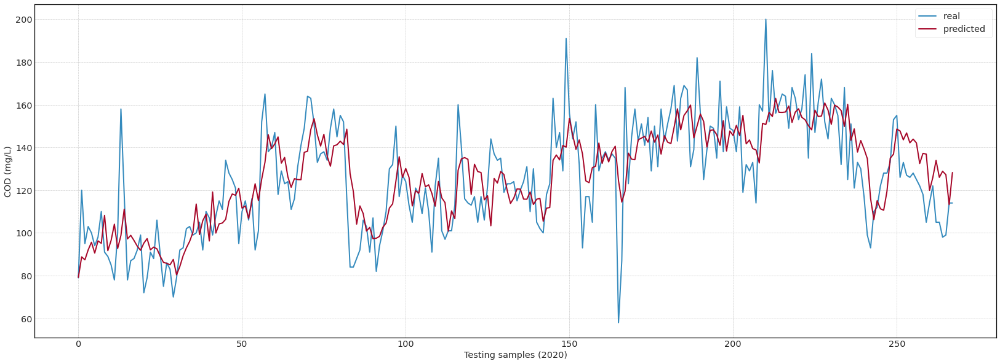

In [ ]:
ensemble_model.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 2 - Model Fusion + Exo


Epoch 1/50
8/8 [==============================] - 0s 23ms/step - loss: 0.5828 - MAPE: 110.3090 - val_loss: 0.5567 - val_MAPE: 561.5124
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 0.5458 - MAPE: 113.5829 - val_loss: 0.5542 - val_MAPE: 594.3397
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 0.5166 - MAPE: 115.3115 - val_loss: 0.5546 - val_MAPE: 621.9667
Epoch 4/50
8/8 [==============================] - 0s 4ms/step - loss: 0.4959 - MAPE: 118.5800 - val_loss: 0.5628 - val_MAPE: 653.3608
Epoch 5/50
8/8 [==============================] - 0s 7ms/step - loss: 0.4810 - MAPE: 121.9186 - val_loss: 0.5728 - val_MAPE: 681.5353
Epoch 6/50
8/8 [==============================] - 0s 4ms/step - loss: 0.4702 - MAPE: 124.6974 - val_loss: 0.5826 - val_MAPE: 702.7034
Epoch 7/50
8/8 [==============================] - 0s 4ms/step - loss: 0.4639 - MAPE: 127.6537 - val_loss: 0.5872 - val_MAPE: 714.0371
Epoch 8/50
8/8 [==============================] - 0s 5ms/step

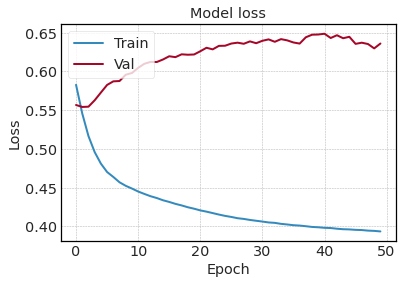

In [ ]:
ensemble_model2 = Ensemble2(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model2.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[32.904877 24.757504 19.869242 21.001064 22.66425  24.031332 24.499306
 24.333857 19.251593 25.468258 25.138962 23.292614 28.152382 21.712732
 20.901667 20.011282 27.294811 25.640812 26.560862 25.023222 23.058046
 24.18815  27.56896  23.848883 24.880981 23.28759  27.091864 31.002748
 28.41816  28.708557 32.112835 27.975994 24.639442 21.872105 20.253517
 21.577183 18.3219   21.903532 19.991114 19.558575 21.406551 17.778112
 22.057402 20.000454 19.504116 19.596262 17.992107 17.785519 17.85581
 17.892649 21.745794 19.409107 17.935314 18.902262 18.070164 18.796955
 18.73848  23.376925 24.046598 20.012302 19.839972 20.894299 19.416962
 18.622055 17.929945 17.782463 18.089573 17.824783 18.24921  19.675
 23.24777  22.77275  27.501696 21.47361  22.238207 22.276083 18.99208
 22.978455 20.28616  22.183605 21.706358 21.374296 22.463211 17.775927
 19.730005 24.329618 22.064598 19.119343 19.928982 20.328575 25.631145
 21.617512 25.470701 20.808363

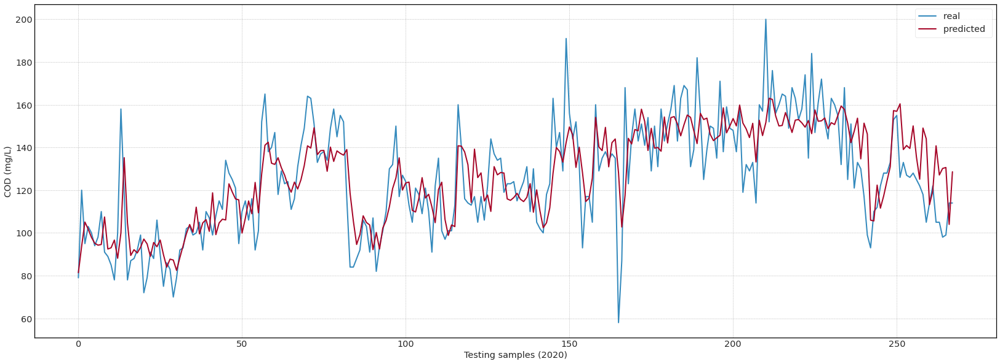

In [ ]:
ensemble_model2.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 3 - Model Selection

     0  1  2
0    0  0  1
1    0  1  0
2    0  1  0
3    0  0  1
4    0  1  0
..  .. .. ..
263  1  0  0
264  0  0  1
265  0  0  1
266  0  0  1
267  1  0  0

[268 rows x 3 columns]
(268, 3)
(268, 4)
Epoch 1/50
8/8 [==============================] - 1s 56ms/step - loss: 1.1668 - accuracy: 0.3402 - val_loss: 1.1943 - val_accuracy: 0.1852
Epoch 2/50
8/8 [==============================] - 0s 4ms/step - loss: 1.1345 - accuracy: 0.3320 - val_loss: 1.1692 - val_accuracy: 0.2222
Epoch 3/50
8/8 [==============================] - 0s 4ms/step - loss: 1.1145 - accuracy: 0.3568 - val_loss: 1.1485 - val_accuracy: 0.2222
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0993 - accuracy: 0.3610 - val_loss: 1.1324 - val_accuracy: 0.1852
Epoch 5/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0872 - accuracy: 0.3942 - val_loss: 1.1205 - val_accuracy: 0.2593
Epoch 6/50
8/8 [==============================] - 0s 5ms/step - loss: 1.0796 - accuracy: 0.4108 - val_loss: 1.1

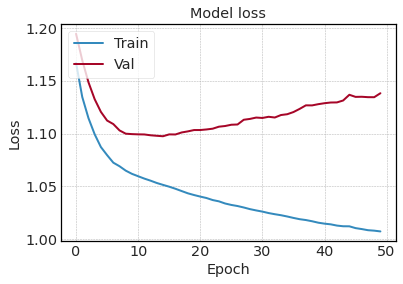

In [ ]:
ensemble_model3 = Ensemble3(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model3.training()

     D_COD_ON    model1    model2    model3
0   -2.116434 -2.448444 -1.826388 -2.371689
1   -1.773113 -2.062277 -1.453914 -1.638685
2   -0.209096 -2.004339 -1.645116 -0.618122
3   -1.162765 -2.054025 -1.289865 -1.173886
4   -0.857591 -1.216786 -1.549819 -0.939082
..        ...       ...       ...       ...
263 -0.781297 -0.501957  0.150245 -0.371332
264 -0.781297 -0.215105  0.159958 -0.155160
265 -1.048325 -0.544161  0.368069 -0.578042
266 -1.010178 -0.320007 -0.874605 -0.510894
267 -0.437976 -0.171713 -0.088484  0.127314

[268 rows x 4 columns]      0  1  2
0    0  0  1
1    0  1  0
2    0  1  0
3    0  0  1
4    0  1  0
..  .. .. ..
263  1  0  0
264  0  0  1
265  0  0  1
266  0  0  1
267  1  0  0

[268 rows x 3 columns]
9/9 [==============================] - 0s 2ms/step - loss: 1.0195 - accuracy: 0.4590
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(10.351062618318476, shape=(), dtype=float64)
MAPEsci:  1250.7148764137944
MAPE:  10.351062618318474
R2:  0.6022311703748586
RMSE:  1

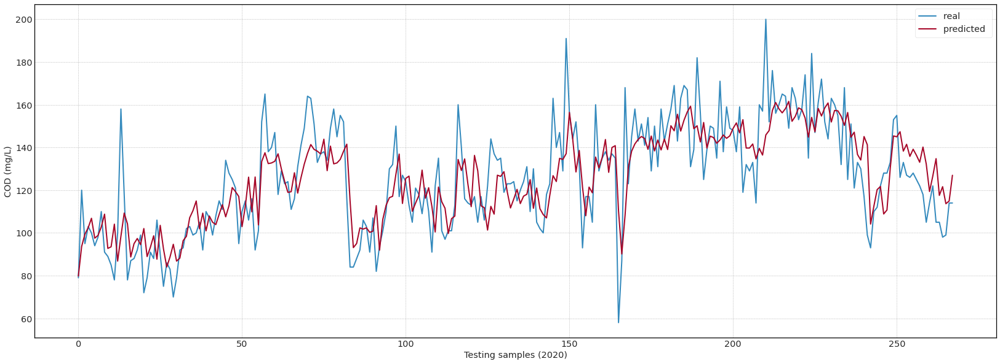

In [ ]:
ensemble_model3.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [ ]:
ensemble_model3.selection.to_list().count(1)

71

### Ensemble 4

In [ ]:
class Ensemble4:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[['model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    # self.Y = self.df['target']
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    # self.y_mean = self.Y.mean()
    # self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
    # self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    from sklearn.svm import SVR
    self.model = SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.2)
    self.model = self.model.fit(self.X_train.values, self.Y_train.values)
  

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target']
    # print(self.Xt)

    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)

    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean


    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [ ]:
# ensemble_model4 = Ensemble4(dataset.iloc[:-135], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
# ensemble_model4.training()

In [ ]:
y1_train = app1.full_prediction.values
y2_train = app2.full_prediction.values
y3_train = app3.full_prediction
yavg_train = ensemble.values
yann_train = ensemble_model2.full_prediction.values
yann2_train = ensemble_model3.full_prediction
y_train = app3.Y_test.values

## Testing


*** ANN estimation ***
MAPE:  15.31170074514472
R2:  -0.6337831741538384
RMSE:  18.478989415997237


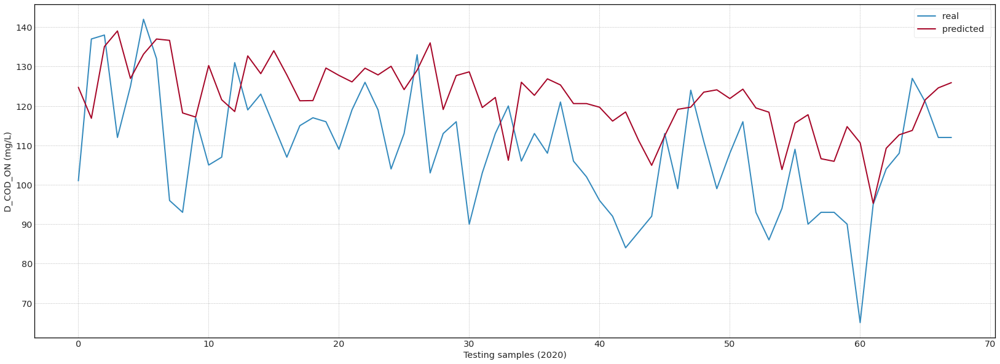

(68,)

In [ ]:
app1.testing(dataset.iloc[-(cut_off + 5):])
app1.full_prediction.shape

*** LSTM estimation ***
MAPE:  24.273417600554204
R2:  -2.672359379980295
RMSE:  27.704709116930808


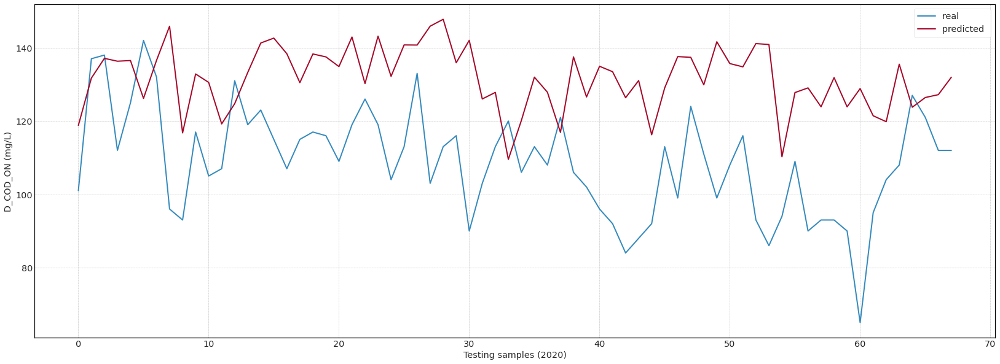

(68, 1)

In [ ]:
app2.testing(dataset.iloc[-(cut_off + 7):])
app2.full_prediction.shape

*** Delta estimation ***
MAPE:  15.460054847738602
R2:  -0.6537850633381301
RMSE:  18.59176151079928


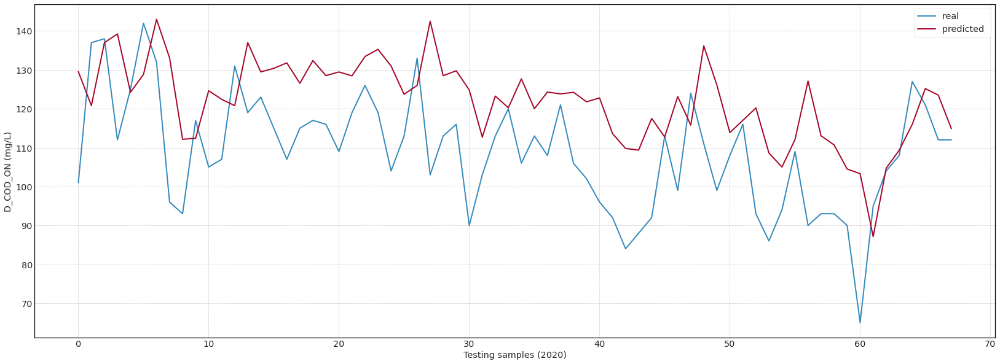

(68,)

In [ ]:
app3.testing(dataset.iloc[-cut_off:])
app3.full_prediction.shape

*** Ensemble estimation ***
MAPE:  17.973814990530975


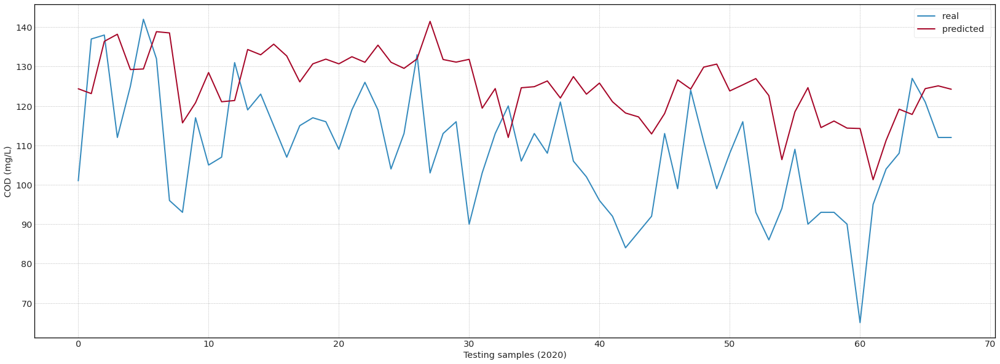

In [ ]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble.values))
#print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[19.681177  19.789978  33.59662   36.574074  26.326704  29.915758
 36.36266   30.779156  12.702544  21.126328  27.492083  15.156939
 17.805632  33.491116  26.834366  29.675125  28.075325  22.480608
 23.253977  28.423162  28.456038  25.052914  30.84113   27.534317
 30.871836  23.581993  26.60907   32.81988   20.406496  28.211685
 25.73773   18.424942  21.516161  11.211012  20.685884  23.247347
 25.88038   16.332989  22.255424  19.779127  21.695711  20.626583
 17.853182  18.01611   11.044118  17.847212  21.745686  22.602852
 24.4555    23.876038  22.53083   23.127922  22.385653  21.949179
 11.488501  18.411726  17.90859   12.823354  15.268406  15.2351885
 16.503813  11.0395    12.1804285 19.479156  15.545666  20.653496
 23.068544  21.303553 ], shape=(68,), dtype=float32)
MAPEsci:  2133.9870789471797
MAPE:  22.348031733186417
R2:  -1.8217266277111772
RMSE:  24.285020556230606


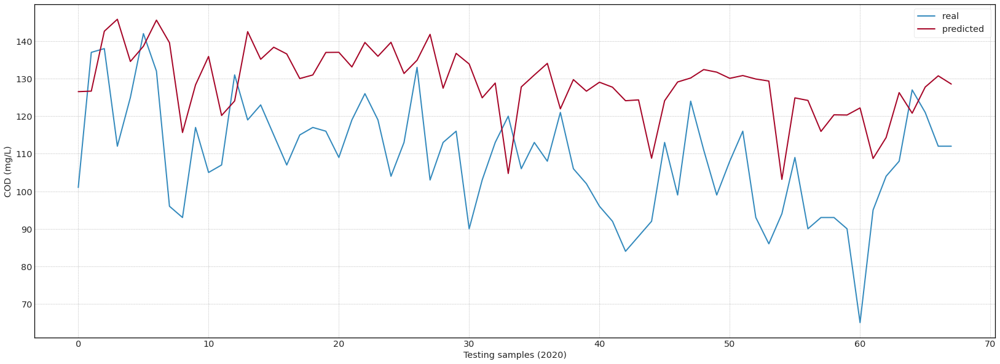

In [ ]:
ensemble_model.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[17.154242  27.954378  33.376183  32.857197  32.64266   21.818935
 37.297573  39.784492  10.994013  24.28504   23.446089  14.036669
 17.895372  34.553085  41.652195  39.249146  43.37291   30.482912
 45.800858  37.12294   35.563694  47.490932  33.043827  45.878105
 32.49774   40.69287   40.10989   49.320915  57.600307  38.187187
 39.301155  16.963192  24.179632  11.4691925 16.076283  25.046692
 21.759674  12.3921175 34.768253  20.739807  33.593033  25.488907
 15.262108  23.038797  13.612999  21.258472  35.343216  31.337748
 37.708263  43.264206  27.209917  26.384645  38.464333  33.464504
 11.53117   18.267008  29.683472  17.288744  24.060665  11.584623
 15.968685  11.006746  11.189368  26.316256  14.666301  19.369352
 18.738226  20.70854  ], shape=(68,), dtype=float32)
MAPE:  28.009833112757633
R2:  -3.7858575267940893
RMSE:  31.627210566735545


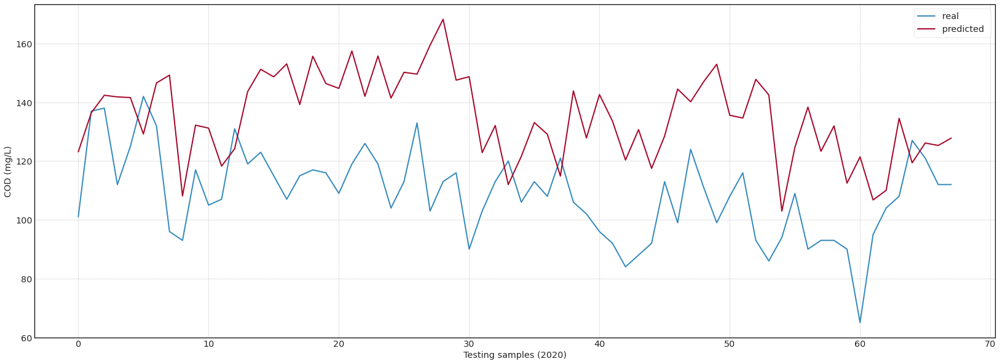

In [ ]:
ensemble_model2.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

    D_COD_ON    model1    model2    model3
0  -0.094655 -0.059059 -0.434531  0.263063
1  -0.933884 -0.496635  0.369358 -0.199036
2   0.439400  0.515876  0.705303  0.659387
3   0.477546  0.735448  0.656353  0.777632
4  -0.514270  0.065313  0.667933 -0.017743
..       ...       ...       ...       ...
63 -0.819444 -0.729353  0.605764 -0.806725
64 -0.666857 -0.668058 -0.125890 -0.454365
65  0.057932 -0.234914  0.039313  0.032681
66 -0.170949 -0.067268  0.087799 -0.056217
67 -0.514270  0.006033  0.384229 -0.514175

[68 rows x 4 columns]      0  1  2
0    0  0  1
1    0  1  0
2    0  1  0
3    0  0  1
4    0  1  0
..  .. .. ..
263  1  0  0
264  0  0  1
265  0  0  1
266  0  0  1
267  1  0  0

[268 rows x 3 columns]
3/3 [==============================] - 0s 3ms/step - loss: 1.1598 - accuracy: 0.3088
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(19.854888311714117, shape=(), dtype=float64)
MAPEsci:  2011.9387658608173
MAPE:  19.85488831171412
R2:  -1.7929295659622624
RMSE:  24.16078267648

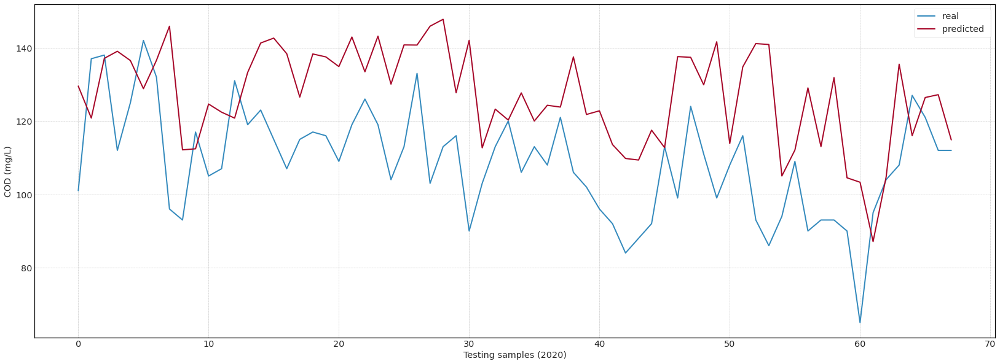

In [ ]:
ensemble_model3.testing(dataset.iloc[-142:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [ ]:
ensemble_model3.selection.to_list().count(3)

0

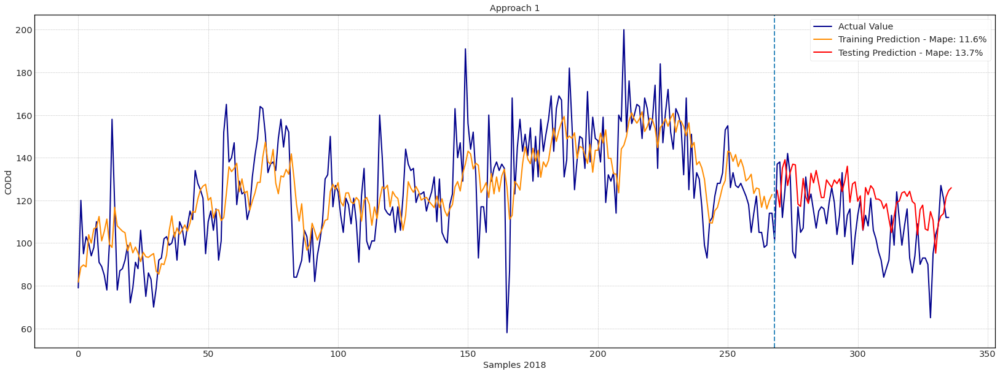

In [ ]:
y1_test = app1.full_prediction.values
y2_test = app2.full_prediction.values
y3_test = app3.full_prediction
yavg_test = ensemble.values
yann_test = ensemble_model2.full_prediction.values
yann2_test = ensemble_model3.full_prediction
y_test = app3.Y_test.values

# yhat_test.value
xx = np.arange(269, 337)
len(xx)

fig = plt.figure(figsize=(28,10))
plt.plot(np.concatenate((y_train, y_test)), 'darkblue', label = 'Actual Value')
# plt.plot(ytrain.values, color='blue')
plt.plot(y1_train, 'darkorange', label = 'Training Prediction - Mape: 11.6%')
plt.plot(xx, y1_test, c='red', label = 'Testing Prediction - Mape: 13.7%')
plt.axvline(268, linestyle = '--')
# fig.text(0.83, 0.45, 'Mape: 9.20%',  fontsize=15)
# fig.text(0.65, 0.2, 'Mape: 5.23%',  fontsize=15)
# fig.text(0.8, 0.78, 'Mape Training: 5.23%',  fontsize=10)
# fig.text(0.8, 0.75, 'Mape Testing: 9.20%',  fontsize=10)
plt.ylabel('CODd')
plt.xlabel('Samples 2018')
plt.legend()
plt.title('Approach 1')
plt.show()

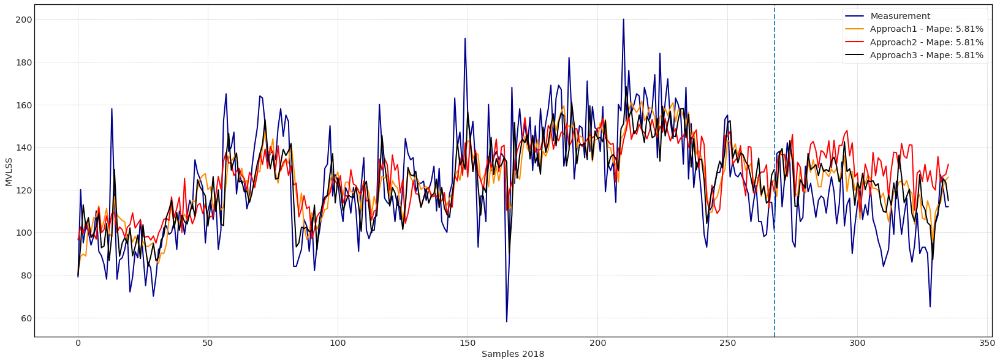

In [ ]:
fig = plt.figure(figsize=(28,10))
plt.plot(np.concatenate((y_train, y_test)), 'darkblue', label = 'Measurement')
# plt.plot(ytrain.values, color='blue')
plt.plot(np.concatenate((y1_train, y1_test)), 'darkorange', label = 'Approach1 - Mape: 5.81%')
plt.plot(np.concatenate((y2_train, y2_test)), 'red', label = 'Approach2 - Mape: 5.81%')
plt.plot(np.concatenate((y3_train, y3_test)), 'black', label = 'Approach3 - Mape: 5.81%')
plt.plot(np.concatenate((yavg_train, yavg_test)), 'magenta', label = 'Avg - Mape: 5.81%')
plt.plot(np.concatenate((yann_train, yann_test)), 'green', label = 'ann - Mape: 5.81%')
plt.plot(np.concatenate((yann2_train, yann2_test)), 'cyan', label = 'ann2 - Mape: 5.81%')



plt.axvline(268, linestyle = '--')
# fig.text(0.83, 0.45, 'Mape: 9.20%',  fontsize=15)
# fig.text(0.65, 0.2, 'Mape: 5.23%',  fontsize=15)
# fig.text(0.8, 0.78, 'Mape Training: 5.23%',  fontsize=10)
# fig.text(0.8, 0.75, 'Mape Testing: 9.20%',  fontsize=10)
plt.ylabel('MVLSS')
plt.xlabel('Samples 2018')
plt.legend()
plt.show()